# Importing Libraries

In [1]:
pip install -U scikit-learn imbalanced-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 69.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.4/238.4 kB 11.4 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.12.4
    Uninstalling imbalanced-learn-0.12.4:
      Successfully uninstalled imbalanced-learn-0.12.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
category-encoders 2.7.0 requires scikit-learn<1.6.0,>=1.0.0, but you have scikit-learn 1.6.1 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [2]:
!pip install peakutils


In [3]:
!pip install biosppy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.0/158.0 kB 4.8 MB/s eta 0:00:00


In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from scipy import stats
import os
import pickle
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from scipy.signal import welch
from scipy.stats import skew, kurtosis
import matplotlib.pyplot as pl
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.model_selection import learning_curve, cross_val_score
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.linear_model import LogisticRegression
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Loading Dataset

In [121]:
DATA_PATH = "../input/wesad-full-dataset/WESAD/" 
OUTPUT_PATH = "/kaggle/working/"  # Store processed files in Kaggle working directory

# Define column names
chest_columns = ['sid', 'acc1', 'acc2', 'acc3', 'ecg', 'emg', 'eda', 'temp', 'resp', 'label']

# List of subject IDs
ids = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17]


### Loading one subject

In [6]:
def pkl_to_chest(filename, subject_id):
    with open(filename, "rb") as f:
        unpickled_df = pickle.load(f, encoding="latin1")  # Use latin1 encoding
    
    chest_acc = unpickled_df["signal"]["chest"]["ACC"]
    chest_ecg = unpickled_df["signal"]["chest"]["ECG"]
    chest_emg = unpickled_df["signal"]["chest"]["EMG"]
    chest_eda = unpickled_df["signal"]["chest"]["EDA"]
    chest_temp = unpickled_df["signal"]["chest"]["Temp"]
    chest_resp = unpickled_df["signal"]["chest"]["Resp"]
    
    lbl = unpickled_df["label"].reshape(unpickled_df["label"].shape[0], 1)
    sid = np.full((lbl.shape[0], 1), subject_id)

    chest_all = np.concatenate((sid, chest_acc, chest_ecg, chest_emg, chest_eda, chest_temp, chest_resp, lbl), axis=1)
    return chest_all

### Merging Chest Data

In [7]:
def merge_chest():
    merged_data = np.empty((0, len(chest_columns)))  # Initialize empty array

    for sid in ids:
        file = os.path.join(DATA_PATH, f'S{sid}', f'S{sid}.pkl')
        print(f"Processing file: {file}")

        if os.path.exists(file):
            subject_data = pkl_to_chest(file, sid)
            merged_data = np.concatenate((merged_data, subject_data), axis=0)
            print(f"Merged data shape so far: {merged_data.shape}")
        else:
            print(f"File {file} not found!")
    merged_df = pd.DataFrame(merged_data, columns=chest_columns)
    merged_df.to_pickle(os.path.join(OUTPUT_PATH, "merged_chest.pkl"))  # Save in Kaggle output directory


### Filter the merged chest data

In [8]:
def filter_chest_data():
    df = pd.read_pickle(os.path.join(OUTPUT_PATH, "merged_chest.pkl"))
    
    df_fltr = df[df["label"].isin([1, 2, 3, 4])]  # Keep only relevant labels
    df_fltr = df_fltr[df_fltr["temp"] > 0]  # Remove invalid temperature readings
    df_fltr["binary_label"] = df_fltr["label"].apply(lambda x: 1 if x == 2 else 0)
    print(f"Merged data shape so far: {df_fltr.shape}")
    df_fltr.to_pickle(os.path.join(OUTPUT_PATH, "merged_chest_fltr.pkl"))  # Save filtered data

### **Run the preprocessing pipeline**

In [9]:
def preprocess():
    merge_chest()
    filter_chest_data()

In [10]:
preprocess()


Processing file: ../input/wesad-full-dataset/WESAD/S2/S2.pkl
Merged data shape so far: (4255300, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S3/S3.pkl
Merged data shape so far: (8800400, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S4/S4.pkl
Merged data shape so far: (13296500, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S5/S5.pkl
Merged data shape so far: (17677100, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S6/S6.pkl
Merged data shape so far: (22626800, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S7/S7.pkl
Merged data shape so far: (26293400, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S8/S8.pkl
Merged data shape so far: (30119600, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S9/S9.pkl
Merged data shape so far: (33775700, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S10/S10.pkl
Merged data shape so far: (37622900, 10)
Processing file: ../input/wesad-full-dataset/WESAD/S11/S11.pkl
Merged data shape s

# Load filtered dataset

In [11]:
filtered_data = pd.read_pickle(os.path.join(OUTPUT_PATH, "merged_chest_fltr.pkl"))
print(f"Filtered Data Shape: {filtered_data.shape}")
filtered_data.head()

Filtered Data Shape: (31470520, 11)


,sid,acc1,acc2,acc3,ecg,emg,eda,temp,resp,label,binary_label
214583,2.0,0.8914,-0.1102,-0.2576,0.030945,-0.003708,5.710983,29.083618,1.191711,1.0,0
214584,2.0,0.8926,-0.1086,-0.2544,0.033646,-0.014145,5.719376,29.122437,1.139832,1.0,0
214585,2.0,0.8930,-0.1094,-0.2580,0.033005,0.010208,5.706406,29.115234,1.141357,1.0,0
214586,2.0,0.8934,-0.1082,-0.2538,0.031815,0.012634,5.712509,29.126709,1.155090,1.0,0
214587,2.0,0.8930,-0.1096,-0.2570,0.030350,0.002060,5.727005,29.100861,1.133728,1.0,0


In [12]:
filtered_data.shape

(31470520, 11)

In [13]:
filtered_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31470520 entries, 214583 to 60620863
Data columns (total 11 columns):
 #   Column        Dtype  
---  ------        -----  
 0   sid           float64
 1   acc1          float64
 2   acc2          float64
 3   acc3          float64
 4   ecg           float64
 5   emg           float64
 6   eda           float64
 7   temp          float64
 8   resp          float64
 9   label         float64
 10  binary_label  int64  
dtypes: float64(10), int64(1)
memory usage: 2.8 GB


In [14]:
filtered_data.describe().T

,count,mean,std,min,25%,50%,75%,max
sid,31470520.0,9.376679,4.700164,2.000000,5.000000,9.000000,14.000000,17.000000
acc1,31470520.0,0.779243,0.142971,0.234600,0.699400,0.837400,0.890600,1.736600
acc2,31470520.0,-0.031314,0.099097,-0.622200,-0.058000,-0.019000,0.019800,0.517600
acc3,31470520.0,-0.382849,0.294020,-1.798400,-0.615800,-0.387000,-0.194600,1.041800
ecg,31470520.0,0.001128,0.265310,-1.499405,-0.088440,-0.024582,0.032913,1.499954
emg,31470520.0,-0.003007,0.012835,-0.610153,-0.009109,-0.002609,0.003250,1.047180
eda,31470520.0,4.606475,3.358262,0.263214,2.031326,3.692245,6.498718,20.433426
temp,31470520.0,33.876948,1.229114,28.045258,33.597382,34.177887,34.598694,35.778046
resp,31470520.0,0.049981,3.799492,-36.196899,-1.918030,-0.160217,2.040100,37.886047
label,31470520.0,2.257485,1.224677,1.000000,1.000000,2.000000,4.000000,4.000000


In [15]:
print(filtered_data['sid'].unique())


[ 2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 13. 14. 15. 16. 17.]


In [16]:
def information(data):
    d_type=data.dtypes
    n_o_U=data.nunique()
    nulls=data.isnull().sum()

    print(pd.DataFrame({"d_types":d_type,"n_uniques":n_o_U,"n_nuls":nulls},index=data.columns))
    print(f"data have  {data.duplicated().sum()} numbers of duplications ")
    print(f"this data have {data.shape[0]} records and {data.shape[1] }  features")

In [17]:
information(filtered_data)

              d_types  n_uniques  n_nuls
sid           float64         15       0
acc1          float64       5188       0
acc2          float64       5019       0
acc3          float64       8819       0
ecg           float64      56698       0
emg           float64       9232       0
eda           float64      47392       0
temp          float64       5129       0
resp          float64      39689       0
label         float64          4       0
binary_label    int64          2       0
data have  0 numbers of duplications 
this data have 31470520 records and 11  features


In [18]:
filtered_data["temp"].min()

28.045257568359375

In [19]:
filtered_data.groupby(['sid', 'label']).head()


,sid,acc1,acc2,acc3,ecg,emg,eda,temp,resp,label,binary_label
214583,2.0,0.8914,-0.1102,-0.2576,0.030945,-0.003708,5.710983,29.083618,1.191711,1.0,0
214584,2.0,0.8926,-0.1086,-0.2544,0.033646,-0.014145,5.719376,29.122437,1.139832,1.0,0
214585,2.0,0.8930,-0.1094,-0.2580,0.033005,0.010208,5.706406,29.115234,1.141357,1.0,0
214586,2.0,0.8934,-0.1082,-0.2538,0.031815,0.012634,5.712509,29.126709,1.155090,1.0,0
214587,2.0,0.8930,-0.1096,-0.2570,0.030350,0.002060,5.727005,29.100861,1.133728,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...
59122164,17.0,0.7168,0.0206,-0.5696,-0.318878,0.006638,7.186508,33.762573,-5.140686,2.0,1
59122165,17.0,0.7186,0.0194,-0.5706,-0.320572,-0.008102,7.187271,33.799011,-5.119324,2.0,1
59122166,17.0,0.7186,0.0218,-0.5684,-0.321945,0.001602,7.185745,33.771698,-5.137634,2.0,1
59122167,17.0,0.7166,0.0218,-0.5676,-0.314713,0.012314,7.186890,33.803558,-5.123901,2.0,1


In [20]:
filtered_data['binary_label'] = filtered_data['binary_label'].astype(float)

# Data Visualization

<Axes: xlabel='binary_label'>

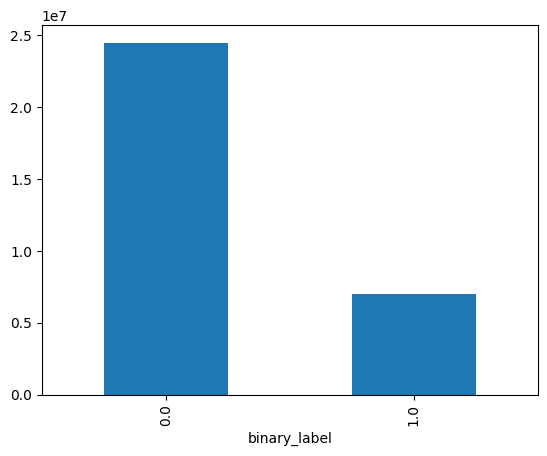

In [21]:
filtered_data["binary_label"].value_counts().plot(kind="bar")

<Axes: xlabel='label'>

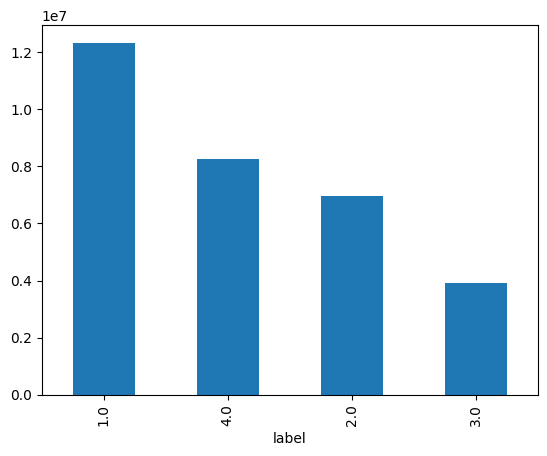

In [22]:
filtered_data["label"].value_counts().plot(kind="bar")

0 = not defined / transient, 1 = baseline, 2 = stress, 3 = amusement,
4 = meditation

0: not stressed , 1: stressed

> The dataset is imbalanced, meaning a classifier might be biased towards predicting Baseline more often.

<Axes: >

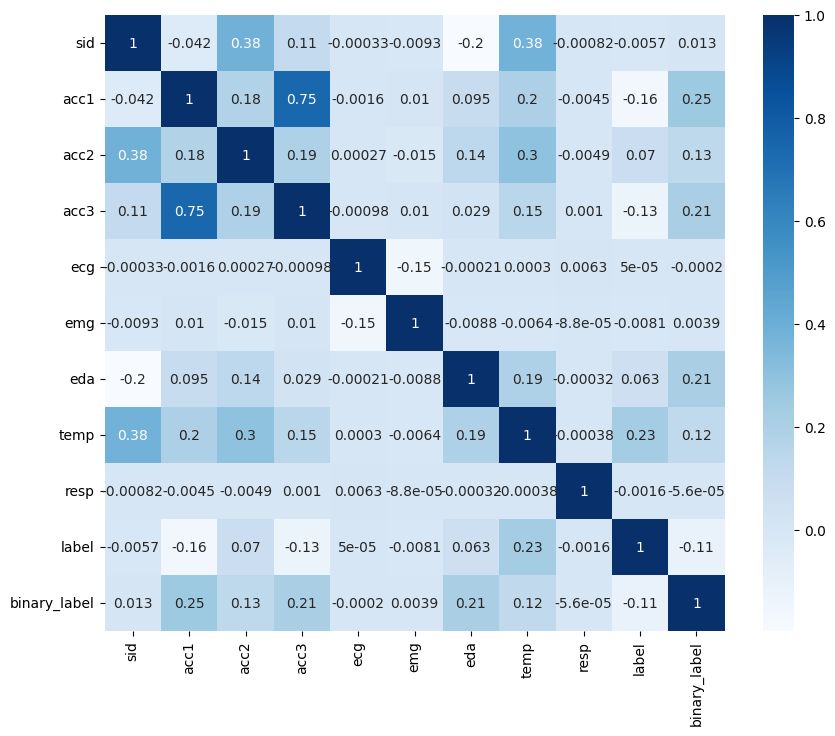

In [23]:
plt.figure(figsize=(10,8))
sns.heatmap(filtered_data.corr(),cmap='Blues',annot=True) 

# Preprocessing

ECG preprocessing

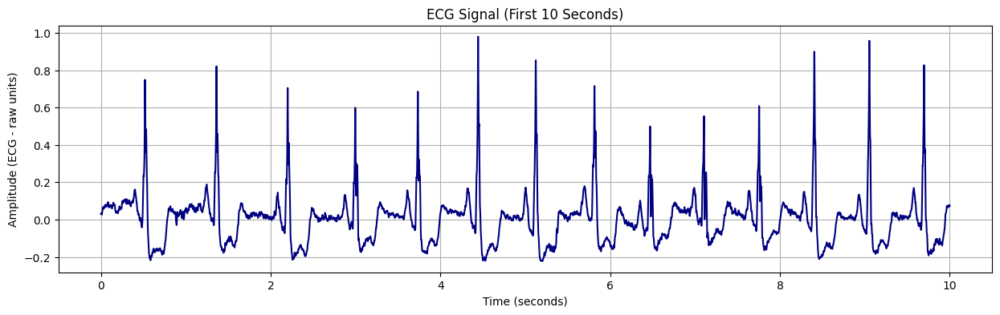

In [24]:
sampling_rate = 700  # Hz
duration_sec = 10
samples_to_plot = sampling_rate * duration_sec
ecg_signal=filtered_data["ecg"]
# --- Time axis ---
time_axis = np.linspace(0, duration_sec, samples_to_plot)

# --- Plot ECG ---
plt.figure(figsize=(15, 4))
plt.plot(time_axis, ecg_signal[:samples_to_plot], color='navy')
plt.title('ECG Signal (First 10 Seconds)')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude (ECG - raw units)')
plt.grid(True)
plt.show()

In [25]:
from biosppy.signals import ecg
ecg_raw= filtered_data["ecg"]
# Assume your ECG signal is in `ecg_raw` and sampling rate is 700 Hz
ecg_processed = ecg.ecg(signal=ecg_raw, sampling_rate=700, show=False)

# The filtered signal (bandpass filter applied)
ecg_filtered = ecg_processed['filtered']

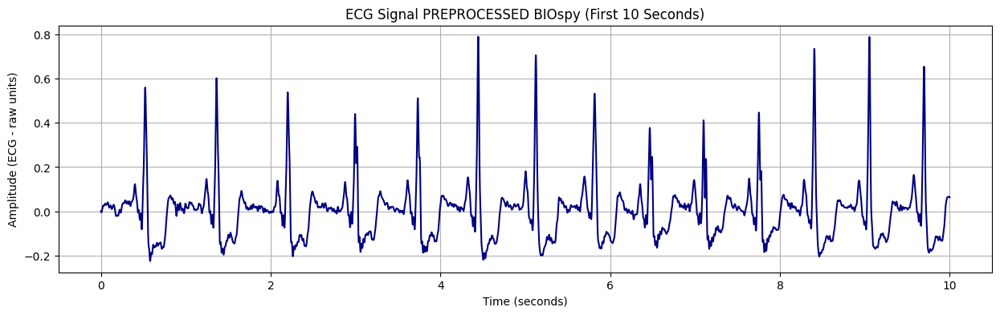

In [26]:
sampling_rate = 700  # Hz
duration_sec = 10
samples_to_plot = sampling_rate * duration_sec
ecg_signal=ecg_filtered
# --- Time axis ---
time_axis = np.linspace(0, duration_sec, samples_to_plot)
# --- Plot ECG ---
plt.figure(figsize=(15, 4))
plt.plot(time_axis, ecg_signal[:samples_to_plot], color='navy')
plt.title('ECG Signal PREPROCESSED BIOspy (First 10 Seconds)')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude (ECG - raw units)')
plt.grid(True)
plt.show()

EDA

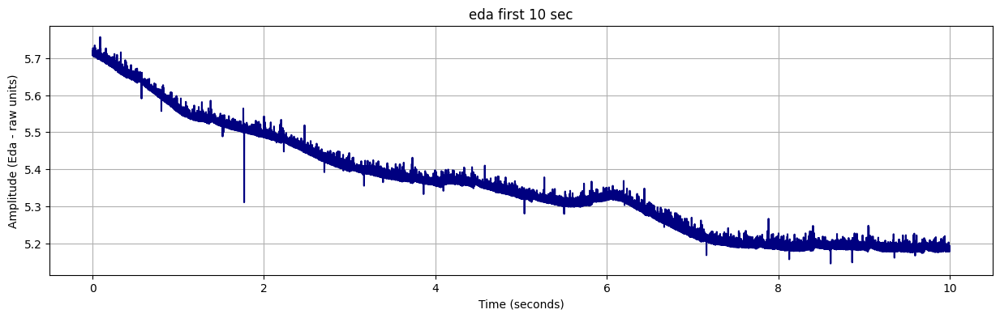

In [27]:
sampling_rate = 700  # Hz
duration_sec = 10
samples_to_plot = sampling_rate * duration_sec
eda_raw=filtered_data['eda']
eda_signal=eda_raw
# --- Time axis ---
time_axis = np.linspace(0, duration_sec, samples_to_plot)

# --- Plot ECG ---
plt.figure(figsize=(15, 4))
plt.plot(time_axis, eda_signal[:samples_to_plot], color='navy')
plt.title('eda first 10 sec')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude (Eda - raw units)')
plt.grid(True)
plt.show()

In [28]:
from biosppy.signals import eda
eda_result = eda.eda(signal=eda_raw, sampling_rate=700, show=False)
processed_eda = eda_result['filtered']


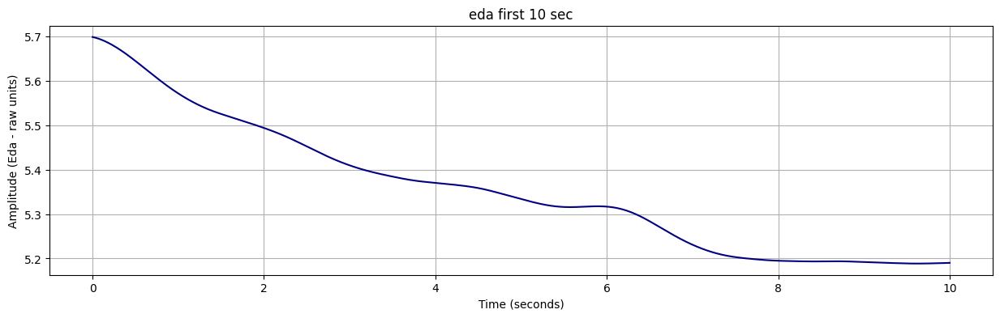

In [29]:
sampling_rate = 700  # Hz
duration_sec = 10
samples_to_plot = sampling_rate * duration_sec
eda_raw=processed_eda
eda_signal=eda_raw
# --- Time axis ---
time_axis = np.linspace(0, duration_sec, samples_to_plot)

# --- Plot ECG ---
plt.figure(figsize=(15, 4))
plt.plot(time_axis, eda_signal[:samples_to_plot], color='navy')
plt.title('eda first 10 sec')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude (Eda - raw units)')
plt.grid(True)
plt.show()

In [30]:
from biosppy.signals import resp
raw_resp=filtered_data['resp']
resp_result = resp.resp(signal=raw_resp, sampling_rate=700, show=False)
processed_resp = resp_result['filtered']

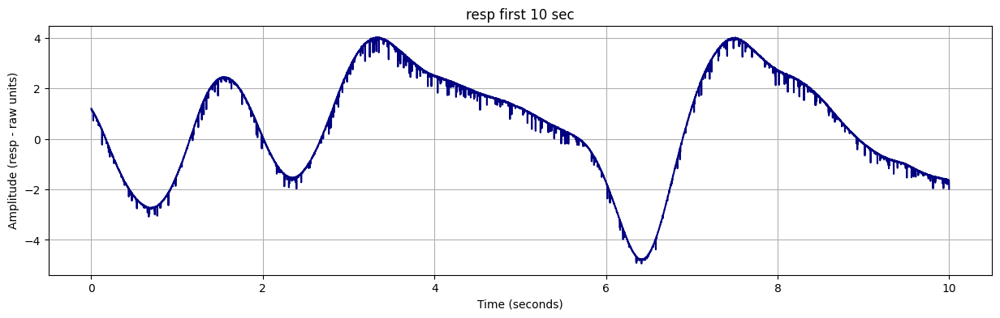

In [31]:
sampling_rate = 700  # Hz
duration_sec = 10
samples_to_plot = sampling_rate * duration_sec
resp_signal=raw_resp
# --- Time axis ---
time_axis = np.linspace(0, duration_sec, samples_to_plot)

# --- Plot ECG ---
plt.figure(figsize=(15, 4))
plt.plot(time_axis, resp_signal[:samples_to_plot], color='navy')
plt.title('resp first 10 sec')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude (resp - raw units)')
plt.grid(True)
plt.show()

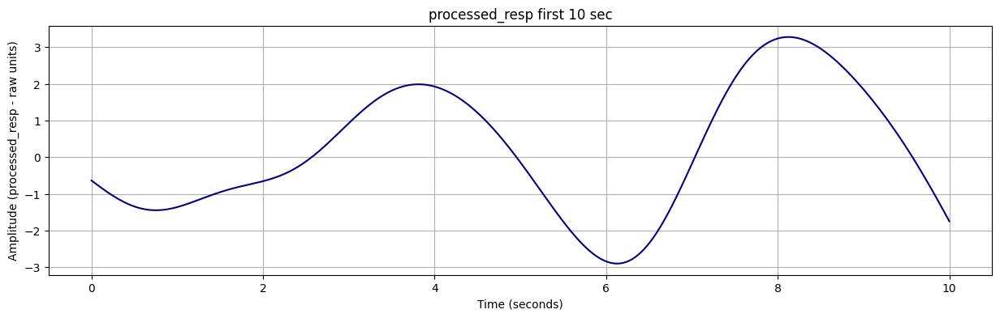

In [32]:
sampling_rate = 700  # Hz
duration_sec = 10
samples_to_plot = sampling_rate * duration_sec
resp_signal=processed_resp
# --- Time axis ---
time_axis = np.linspace(0, duration_sec, samples_to_plot)

# --- Plot ECG ---
plt.figure(figsize=(15, 4))
plt.plot(time_axis, resp_signal[:samples_to_plot], color='navy')
plt.title('processed_resp first 10 sec')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude (processed_resp - raw units)')
plt.grid(True)
plt.show()

In [33]:
filtered_data['resp_filtered'] = processed_resp
filtered_data['ecg_filtered'] = ecg_filtered
filtered_data['eda_filtered'] = processed_eda

In [34]:
filtered_data.head()

,sid,acc1,acc2,acc3,ecg,emg,eda,temp,resp,label,binary_label,resp_filtered,ecg_filtered,eda_filtered
214583,2.0,0.8914,-0.1102,-0.2576,0.030945,-0.003708,5.710983,29.083618,1.191711,1.0,0.0,-0.636665,0.000701,5.698468
214584,2.0,0.8926,-0.1086,-0.2544,0.033646,-0.014145,5.719376,29.122437,1.139832,1.0,0.0,-0.639193,-0.001236,5.698407
214585,2.0,0.8930,-0.1094,-0.2580,0.033005,0.010208,5.706406,29.115234,1.141357,1.0,0.0,-0.641719,-0.002941,5.698346
214586,2.0,0.8934,-0.1082,-0.2538,0.031815,0.012634,5.712509,29.126709,1.155090,1.0,0.0,-0.644246,-0.004205,5.698285
214587,2.0,0.8930,-0.1096,-0.2570,0.030350,0.002060,5.727005,29.100861,1.133728,1.0,0.0,-0.646771,-0.004854,5.698222


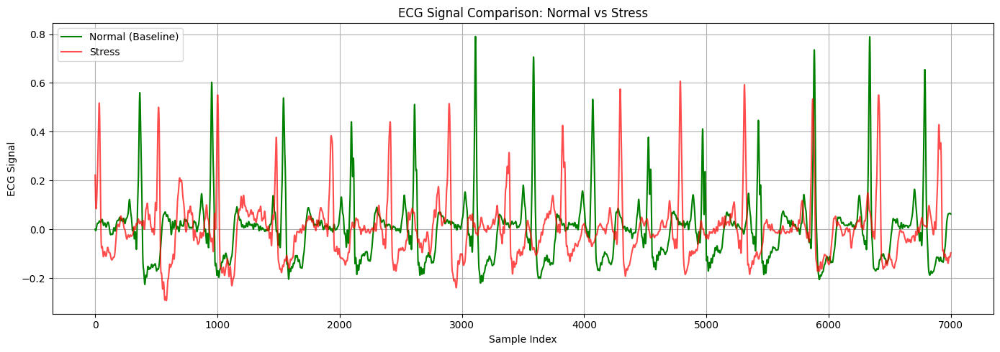

In [35]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 10          # Duration to plot (seconds)
samples = fs * duration
ecg_column = 'ecg_filtered'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_ecg = filtered_data[filtered_data[label_column] == 0][ecg_column].values[:samples]
stress_ecg = filtered_data[filtered_data[label_column] == 1][ecg_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_ecg, label='Normal (Baseline)', color='green')
plt.plot(stress_ecg, label='Stress', color='red', alpha=0.7)
plt.title("ECG Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("ECG Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


**The stress condition exhibits higher amplitude peaks and more variability in the signal, indicating increased heart rate and irregularity, which are common physiological responses to stress. The normal baseline shows more consistent and lower amplitude peaks, suggesting a steadier heart rhythm.**

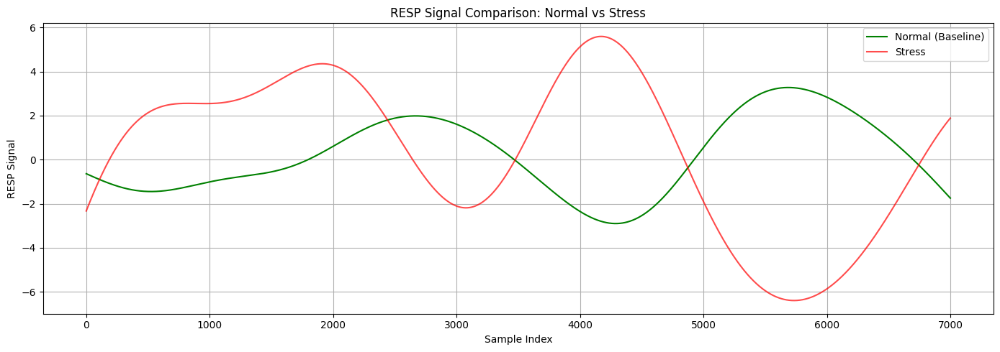

In [36]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 10       # Duration to plot (seconds)
samples = fs * duration
resp_column = 'resp_filtered'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_resp = filtered_data[filtered_data[label_column] == 0][resp_column].values[:samples]
stress_resp = filtered_data[filtered_data[label_column] == 1][resp_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_resp, label='Normal (Baseline)', color='green')
plt.plot(stress_resp, label='Stress', color='red', alpha=0.7)
plt.title("RESP Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("RESP Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


**The stress condition shows a more irregular and higher amplitude breathing pattern, with sharper peaks and deeper troughs, indicating faster and more uneven respiration typical of stress. The normal baseline has a smoother, more consistent sinusoidal pattern, suggesting steady and regular breathing.**

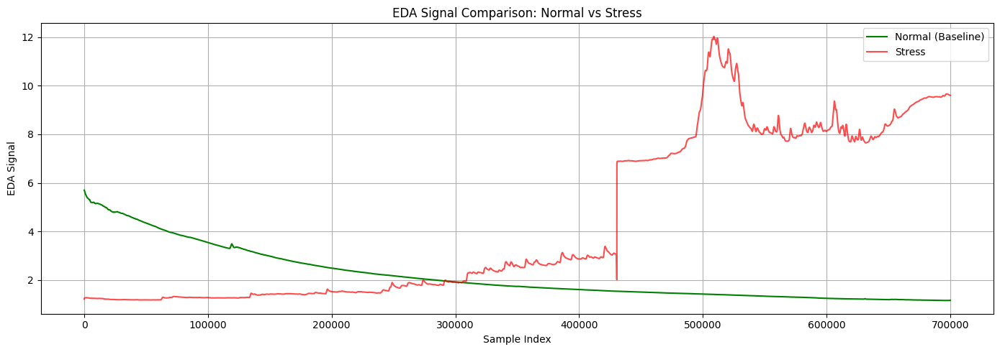

In [37]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 1000         # Duration to plot (seconds)
samples = fs * duration
eda_column = 'eda_filtered'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_eda = filtered_data[filtered_data[label_column] == 0][eda_column].values[:samples]
stress_eda = filtered_data[filtered_data[label_column] == 1][eda_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_eda, label='Normal (Baseline)', color='green')
plt.plot(stress_eda, label='Stress', color='red', alpha=0.7)
plt.title("EDA Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("EDA Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


* Baseline (Normal): The green line, representing the baseline EDA signal, shows a gradual decrease over time, starting at around 5 EDA signal and ending at approximately 1.
* Stress: The red line, representing the EDA signal under stress, initially stays relatively flat at around 2 EDA signal. However, around the sample index of 450000, there is a dramatic and sharp increase, peaking at 12, followed by a gradual decline. This indicates a significant and sudden change in skin conductance during the stress condition.
* While the baseline signal exhibits a slow decline, the stress signal is characterized by a large and rapid increase, indicating a strong activation of the autonomic nervous system. This is a typical physiological response to a stressor, as increased sweat gland activity leads to higher skin conductance.

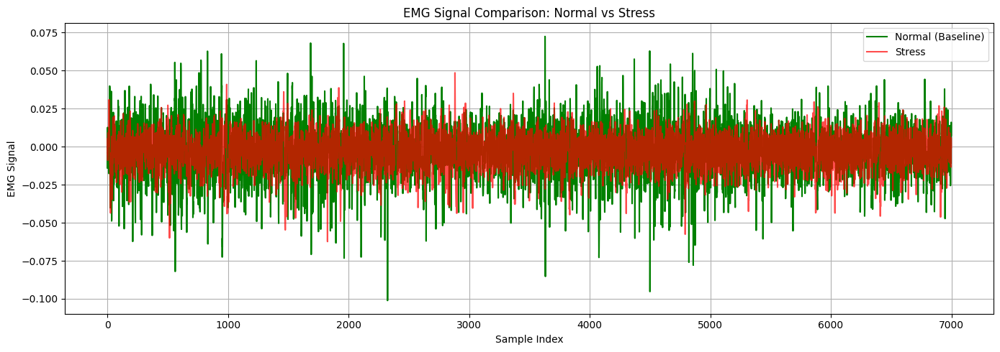

In [38]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 10          # Duration to plot (seconds)
samples = fs * duration
emg_column = 'emg'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_emg = filtered_data[filtered_data[label_column] == 0][emg_column].values[:samples]
stress_emg = filtered_data[filtered_data[label_column] == 1][emg_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_emg, label='Normal (Baseline)', color='green')
plt.plot(stress_emg, label='Stress', color='red', alpha=0.7)
plt.title("EMG Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("EMG Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


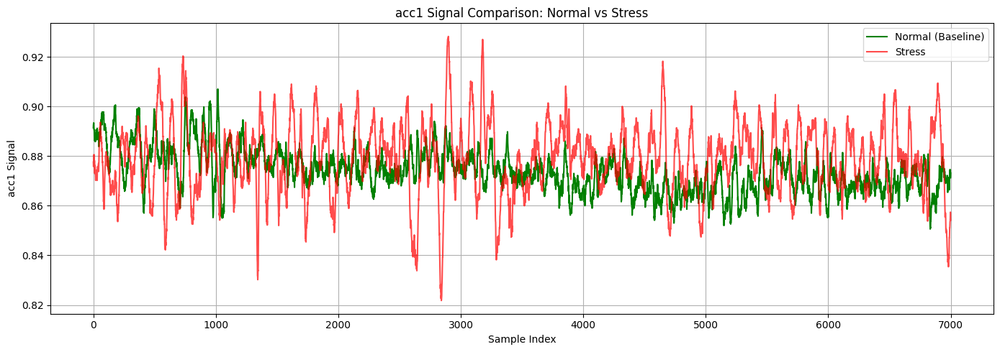

In [39]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 10          # Duration to plot (seconds)
samples = fs * duration
acc_column = 'acc1'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_acc = filtered_data[filtered_data[label_column] == 0][acc_column].values[:samples]
stress_acc = filtered_data[filtered_data[label_column] == 1][acc_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_acc, label='Normal (Baseline)', color='green')
plt.plot(stress_acc, label='Stress', color='red', alpha=0.7)
plt.title("acc1 Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("acc1 Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


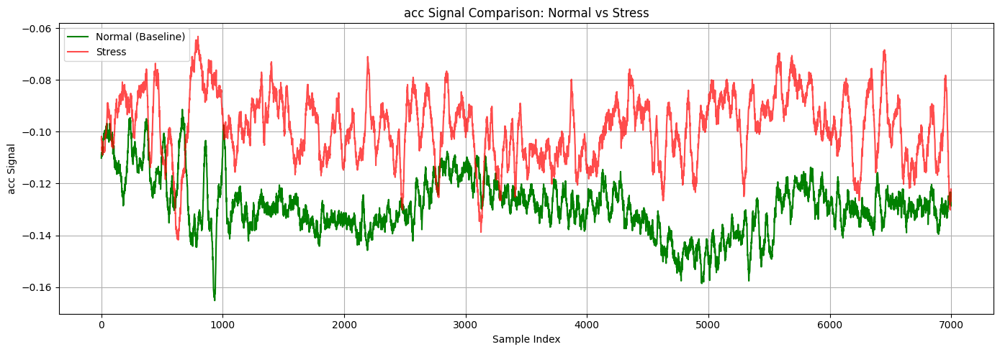

In [40]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 10          # Duration to plot (seconds)
samples = fs * duration
acc2_column = 'acc2'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_acc2 = filtered_data[filtered_data[label_column] == 0][acc2_column].values[:samples]
stress_acc2 = filtered_data[filtered_data[label_column] == 1][acc2_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_acc2, label='Normal (Baseline)', color='green')
plt.plot(stress_acc2, label='Stress', color='red', alpha=0.7)
plt.title("acc Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("acc Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


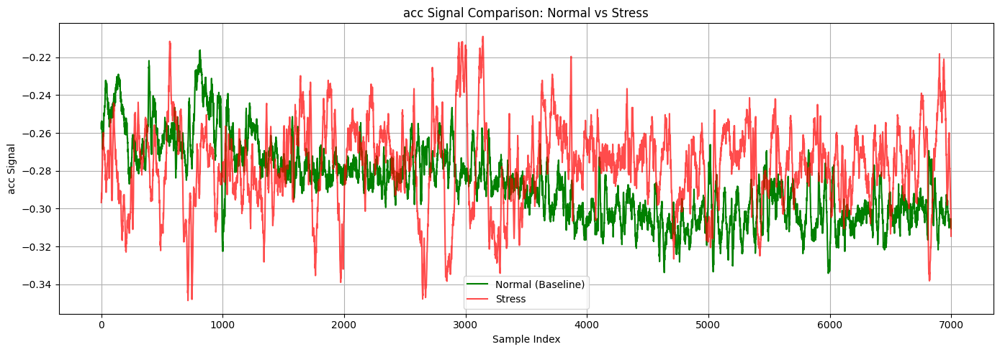

In [41]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 10          # Duration to plot (seconds)
samples = fs * duration
acc3_column = 'acc3'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_acc3 = filtered_data[filtered_data[label_column] == 0][acc3_column].values[:samples]
stress_acc3 = filtered_data[filtered_data[label_column] == 1][acc3_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_acc3, label='Normal (Baseline)', color='green')
plt.plot(stress_acc3, label='Stress', color='red', alpha=0.7)
plt.title("acc Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("acc Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


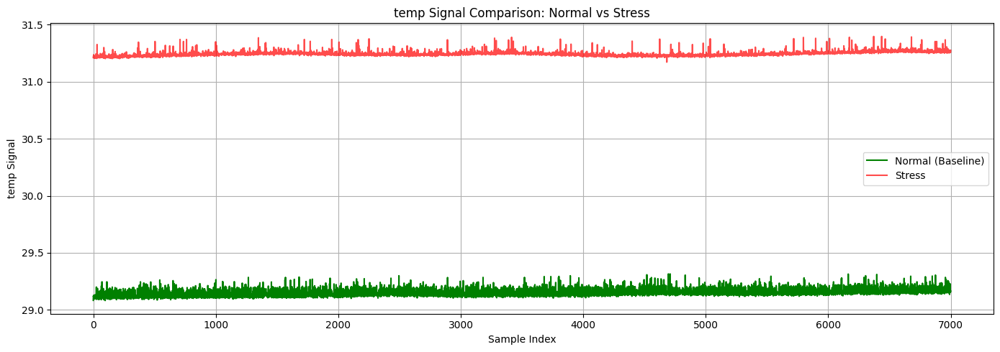

In [42]:
import matplotlib.pyplot as plt

# Parameters
fs = 700              # Sampling frequency (Hz)
duration = 10          # Duration to plot (seconds)
samples = fs * duration
temp_column = 'temp'    # Update if your ECG column has a different name
label_column = 'binary_label'

# Filter ECG signals for Normal (1) and Stress (2)
normal_temp = filtered_data[filtered_data[label_column] == 0][temp_column].values[:samples]
stress_temp = filtered_data[filtered_data[label_column] == 1][temp_column].values[:samples]

# Plot the ECG signals
plt.figure(figsize=(14, 5))
plt.plot(normal_temp, label='Normal (Baseline)', color='green')
plt.plot(stress_temp, label='Stress', color='red', alpha=0.7)
plt.title("temp Signal Comparison: Normal vs Stress")
plt.xlabel("Sample Index")
plt.ylabel("temp Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


* Normal signal is saturated from 29 to 29.5
* Stressed signal is saturated from 31 to 31.5

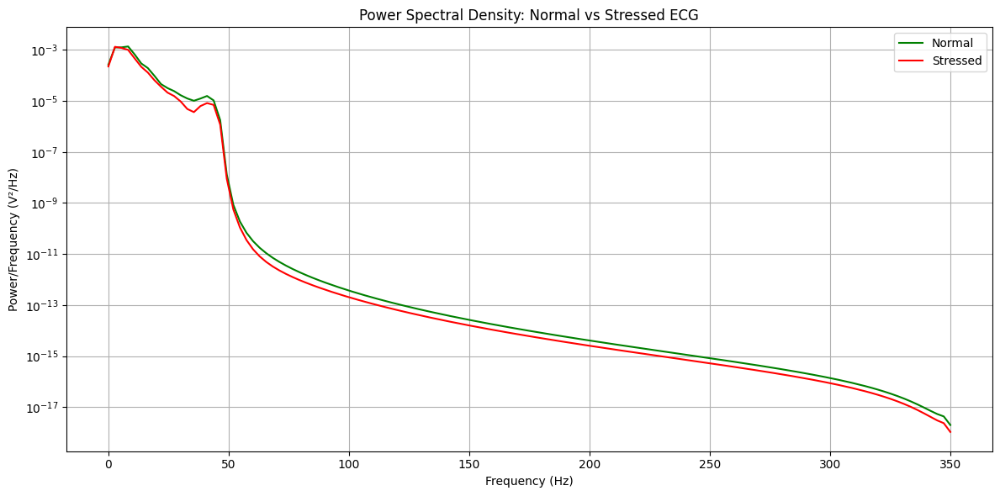

In [43]:
import matplotlib.pyplot as plt
from scipy.signal import welch

# Replace these with actual column names
ecg_column = 'ecg_filtered'
label_column = 'binary_label'  # This should contain values like 'stressed' or 'normal'
fs = 700  # Sampling frequency in Hz (adjust to your dataset)

# Split the data
normal_ecg = filtered_data[filtered_data[label_column] == 0][ecg_column].values[:samples]
stress_ecg = filtered_data[filtered_data[label_column] == 1][ecg_column].values[:samples]


# Compute PSD using Welch's method
freq_n, psd_n = welch(normal_ecg, fs=fs)
freq_s, psd_s = welch(stress_ecg, fs=fs)

# Plot both PSDs
plt.figure(figsize=(12, 6))
plt.semilogy(freq_n, psd_n, label='Normal', color='green')
plt.semilogy(freq_s, psd_s, label='Stressed', color='red')
plt.title('Power Spectral Density: Normal vs Stressed ECG')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (V²/Hz)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In the lower frequency range (below 50 Hz), the stressed ECG signal has slightly higher power than the normal ECG signal. This indicates that there might be more low-frequency activity in the ECG signal during stress.

As the frequency increases (above 50 Hz), the power of both signals decreases rapidly. The difference between the normal and stressed signals becomes less pronounced at higher frequencies. ( typically because of the notch filter)

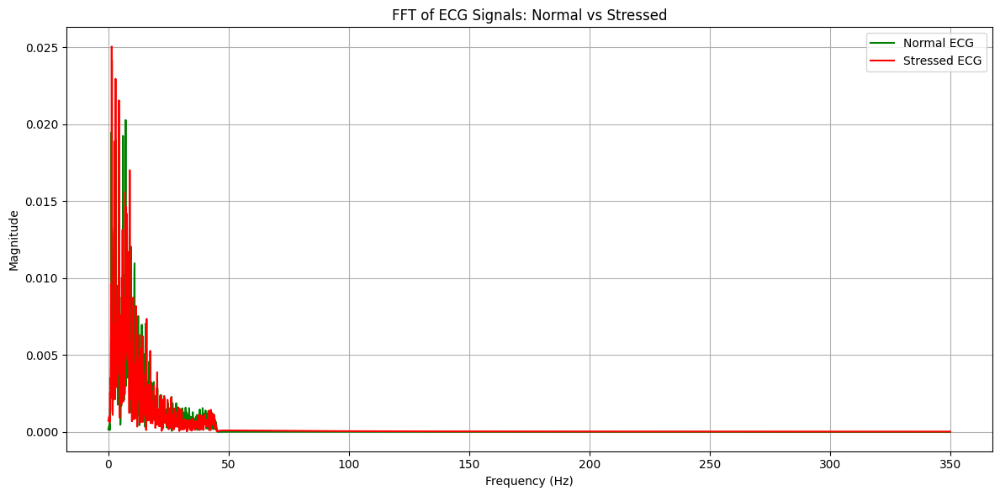

In [44]:
import numpy as np
import matplotlib.pyplot as plt

# Sampling frequency
fs = 700  # adjust this to match your ECG sampling rate

# Get ECG signals
ecg_normal = filtered_data[filtered_data[label_column] == 0][ecg_column].values[:samples]
ecg_stress = filtered_data[filtered_data[label_column] == 1][ecg_column].values[:samples]

# Compute FFT
def compute_fft(signal, fs):
    n = len(signal)
    f = np.fft.rfftfreq(n, d=1/fs)
    fft_values = np.fft.rfft(signal)
    fft_magnitude = np.abs(fft_values) / n
    return f, fft_magnitude

freq_normal, fft_normal = compute_fft(ecg_normal, fs)
freq_stress, fft_stress = compute_fft(ecg_stress, fs)

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(freq_normal, fft_normal, label='Normal ECG', color='green')
plt.plot(freq_stress, fft_stress, label='Stressed ECG', color='red')
plt.title('FFT of ECG Signals: Normal vs Stressed')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Both signals show a prominent peak at lower frequencies, which corresponds to the heart rate.
The stressed ECG signal has a higher magnitude at the dominant low-frequency peak. This indicates that the heart rate component is more pronounced during stress.
As the frequency increases, the magnitude of both signals decreases.
There are some differences in the **mid-frequency range (around 20-50 Hz)**, where the stressed ECG signal shows slightly higher magnitudes. These differences might be related to other physiological changes associated with stress.

In [45]:
Data = filtered_data.drop(['resp', 'ecg', 'eda','acc1','acc2','acc3','sid','emg','temp'], axis=1)
Data.head()

,label,binary_label,resp_filtered,ecg_filtered,eda_filtered
214583,1.0,0.0,-0.636665,0.000701,5.698468
214584,1.0,0.0,-0.639193,-0.001236,5.698407
214585,1.0,0.0,-0.641719,-0.002941,5.698346
214586,1.0,0.0,-0.644246,-0.004205,5.698285
214587,1.0,0.0,-0.646771,-0.004854,5.698222


In [46]:
Data.head()

,label,binary_label,resp_filtered,ecg_filtered,eda_filtered
214583,1.0,0.0,-0.636665,0.000701,5.698468
214584,1.0,0.0,-0.639193,-0.001236,5.698407
214585,1.0,0.0,-0.641719,-0.002941,5.698346
214586,1.0,0.0,-0.644246,-0.004205,5.698285
214587,1.0,0.0,-0.646771,-0.004854,5.698222


# Feature Extraction

In [47]:
import numpy as np
from scipy import signal, interpolate
from scipy.stats import skew, kurtosis
from biosppy.signals import ecg  # Needed for ECG processing

def extract_hr_hrv_features_interpolated(ecg_signal, fs=700):
    """
    Extract heart rate and HRV features from an ECG signal and interpolate HR.
    """
    # Process ECG to get R-peaks using biosppy
    ecg_out = ecg.ecg(signal=ecg_signal, sampling_rate=fs, show=False)
    rpeaks = ecg_out['rpeaks']
    
    if len(rpeaks) < 3:  # Not enough peaks for HRV analysis
        return {key: np.nan for key in [
            "hr_mean", "hr_median", "hr_min", "hr_max", "hr_variance", "hr_std",
            "hr_q1", "hr_q3", "mean_rr", "sdnn", "rmssd", "hr_skew", "hr_kurtosis"
        ]}
    
    rr_intervals = np.diff(rpeaks) / fs  # In seconds
    hr_instantaneous = 60 / rr_intervals  # BPM

    hr_times = rpeaks[:-1] + np.diff(rpeaks) / 2
    hr_times = hr_times / fs

    t_interp = np.arange(len(ecg_signal)) / fs

    f_cubic = interpolate.interp1d(
        hr_times, hr_instantaneous, kind='cubic',
        bounds_error=False, fill_value=(hr_instantaneous[0], hr_instantaneous[-1])
    )
    hr_interpolated = f_cubic(t_interp)

    return {
        "hr_mean": np.mean(hr_interpolated),
        "hr_median": np.median(hr_interpolated),
        "hr_min": np.min(hr_interpolated),
        "hr_max": np.max(hr_interpolated),
        "hr_variance": np.var(hr_interpolated),
        "hr_std": np.std(hr_interpolated),
        "hr_q1": np.percentile(hr_interpolated, 25),
        "hr_q3": np.percentile(hr_interpolated, 75),
        "mean_rr": np.mean(rr_intervals),
        "sdnn": np.std(rr_intervals),
        "rmssd": np.sqrt(np.mean(np.square(np.diff(rr_intervals)))),
        "hr_skew": skew(hr_interpolated),
        "hr_kurtosis": kurtosis(hr_interpolated)
    }

In [48]:
def extract_time_domain_features(signal_data):
    """
    Extract basic time-domain statistics from a signal.
    """
    signal_array = np.asarray(signal_data)

    if len(signal_array) == 0:
        return {key: np.nan for key in [
            'mean', 'median', 'variance', 'std', 'min', 'max',
            'q1', 'q3', 'skew', 'kurtosis'
        ]}
    
    return {
        'mean': np.mean(signal_array),
        'median': np.median(signal_array),
        'variance': np.var(signal_array),
        'std': np.std(signal_array),
        'min': np.min(signal_array),
        'max': np.max(signal_array),
        'q1': np.percentile(signal_array, 25),
        'q3': np.percentile(signal_array, 75),
        'skew': skew(signal_array),
        'kurtosis': kurtosis(signal_array)
    }

In [49]:
def extract_psd_features(signal_data, fs=700):
    """
    Extract PSD (Power Spectral Density) features using Welch’s method.
    """
    signal_array = np.asarray(signal_data)

    if len(signal_array) < 10:
        return {key: np.nan for key in [
            'psd_mean', 'psd_median', 'psd_peak_freq', 'psd_total_power',
            'psd_variance', 'psd_std', 'psd_skewness', 'psd_kurtosis',
            'psd_q1', 'psd_q3'
        ]}
    
    try:
        nperseg = min(256, len(signal_array))
        f, psd = signal.welch(signal_array, fs, nperseg=nperseg, average='median')

        return {
            'psd_mean': np.nanmean(psd),
            'psd_median': np.nanmedian(psd),
            'psd_peak_freq': f[np.nanargmax(psd)] if np.any(psd > 0) else np.nan,
            'psd_total_power': np.nansum(psd),
            'psd_variance': np.nanvar(psd),
            'psd_std': np.nanstd(psd),
            'psd_skewness': skew(psd, nan_policy='omit'),
            'psd_kurtosis': kurtosis(psd, nan_policy='omit'),
            'psd_q1': np.nanpercentile(psd, 25),
            'psd_q3': np.nanpercentile(psd, 75)
        }

    except Exception as e:
        print(f"PSD calculation failed: {str(e)}")
        return {key: np.nan for key in [
            'psd_mean', 'psd_median', 'psd_peak_freq', 'psd_total_power',
            'psd_variance', 'psd_std', 'psd_skewness', 'psd_kurtosis',
            'psd_q1', 'psd_q3'
        ]}

In [50]:
def extract_all_features(window_data, fs=700):
    """
    Extract all time-domain and frequency-domain features from ECG, EDA, and RESP signals.
    """
    features = {}

    # ECG
    hr_features = extract_hr_hrv_features_interpolated(window_data['ecg'], fs)
    features.update(hr_features)

    ecg_psd_features = extract_psd_features(window_data['ecg'], fs)
    features.update({f'ecg_{k}': v for k, v in ecg_psd_features.items()})

    # EDA
    eda_time_features = extract_time_domain_features(window_data['eda'])
    features.update({f'eda_{k}': v for k, v in eda_time_features.items()})

    eda_psd_features = extract_psd_features(window_data['eda'], fs)
    features.update({f'eda_{k}': v for k, v in eda_psd_features.items()})

    # RESP
    resp_time_features = extract_time_domain_features(window_data['resp'])
    features.update({f'resp_{k}': v for k, v in resp_time_features.items()})

    resp_psd_features = extract_psd_features(window_data['resp'], fs)
    features.update({f'resp_{k}': v for k, v in resp_psd_features.items()})

    return features

# window segmentation

In [51]:
def segment_df_into_windows(df, window_size_sec=10, step_size_sec=5, fs=700):
    """
    Segments a DataFrame into overlapping windows with labels.

    Parameters:
    - df: DataFrame with columns 'ecg_filtered', 'eda_filtered', 'resp_filtered', 'label', 'binary_label'
    - window_size_sec: duration of window in seconds
    - step_size_sec: step size between windows in seconds
    - fs: sampling frequency (Hz)

    Returns:
    - List of dicts with signal windows and associated labels
    """
    window_size = int(window_size_sec * fs)
    step_size = int(step_size_sec * fs)
    num_samples = len(df)
    windows = []

    for start in range(0, num_samples - window_size + 1, step_size):
        end = start + window_size
        window_df = df.iloc[start:end]

        # Get the most frequent label in the window
        label = window_df['label'].mode()[0]
        binary_label = window_df['binary_label'].mode()[0]

        window = {
            'ecg': window_df['ecg_filtered'].values,
            'eda': window_df['eda_filtered'].values,
            'resp': window_df['resp_filtered'].values,
            'label': label,
            'binary_label': binary_label
        }
        windows.append(window)

    return windows


In [52]:
Data_60_30=segment_df_into_windows(Data,60,30,700)

In [53]:
Data_60_10=segment_df_into_windows(Data,60,10,700)

In [54]:
Data_60_20=segment_df_into_windows(Data,60,20,700)

In [55]:
# Initialize a list to store all the extracted features
feature_list = []

# Loop through each window
for i in range(len(Data_60_10)):
    features = {}

    # Extract the current window
    window = Data_60_10[i]

    # Get the current window's signals
    window_data = {
        'ecg': window['ecg'],
        'eda': window['eda'],
        'resp': window['resp']
    }

    # Extract features
    all_features = extract_all_features(window_data)
    features.update(all_features)

    # Add labels
    features['label'] = window['label']
    features['binary_label'] = window['binary_label']

    # Store the feature dict
    feature_list.append(features)

# Convert list of dicts to a DataFrame
features_df_60_10 = pd.DataFrame(feature_list)


In [56]:
# Initialize a list to store all the extracted features
feature_list = []

# Loop through each window
for i in range(len(Data_60_20)):
    features = {}

    # Extract the current window
    window = Data_60_20[i]

    # Get the current window's signals
    window_data = {
        'ecg': window['ecg'],
        'eda': window['eda'],
        'resp': window['resp']
    }

    # Extract features
    all_features = extract_all_features(window_data)
    features.update(all_features)

    # Add labels
    features['label'] = window['label']
    features['binary_label'] = window['binary_label']

    # Store the feature dict
    feature_list.append(features)

# Convert list of dicts to a DataFrame
features_df_60_20 = pd.DataFrame(feature_list)


In [57]:
# Initialize a list to store all the extracted features
feature_list = []

# Loop through each window
for i in range(len(Data_60_30)):
    features = {}

    # Extract the current window
    window = Data_60_30[i]

    # Get the current window's signals
    window_data = {
        'ecg': window['ecg'],
        'eda': window['eda'],
        'resp': window['resp']
    }

    # Extract features
    all_features = extract_all_features(window_data)
    features.update(all_features)

    # Add labels
    features['label'] = window['label']
    features['binary_label'] = window['binary_label']

    # Store the feature dict
    feature_list.append(features)

# Convert list of dicts to a DataFrame
features_df_60_30 = pd.DataFrame(feature_list)


In [58]:
information(features_df_60_10)

                   d_types  n_uniques  n_nuls
hr_mean            float64       4490       0
hr_median          float64       4452       0
hr_min             float64       4258       0
hr_max             float64       4172       0
hr_variance        float64       4490       0
...                    ...        ...     ...
resp_psd_kurtosis  float64       4490       0
resp_psd_q1        float64       4490       0
resp_psd_q3        float64       4490       0
label              float64          4       0
binary_label       float64          2       0

[65 rows x 3 columns]
data have  0 numbers of duplications 
this data have 4490 records and 65  features


In [59]:
information(features_df_60_20)

                   d_types  n_uniques  n_nuls
hr_mean            float64       2245       0
hr_median          float64       2232       0
hr_min             float64       2222       0
hr_max             float64       2208       0
hr_variance        float64       2245       0
...                    ...        ...     ...
resp_psd_kurtosis  float64       2245       0
resp_psd_q1        float64       2245       0
resp_psd_q3        float64       2245       0
label              float64          4       0
binary_label       float64          2       0

[65 rows x 3 columns]
data have  0 numbers of duplications 
this data have 2245 records and 65  features


In [60]:
information(features_df_60_30)

                   d_types  n_uniques  n_nuls
hr_mean            float64       1497       0
hr_median          float64       1496       0
hr_min             float64       1495       0
hr_max             float64       1488       0
hr_variance        float64       1497       0
...                    ...        ...     ...
resp_psd_kurtosis  float64       1497       0
resp_psd_q1        float64       1497       0
resp_psd_q3        float64       1497       0
label              float64          4       0
binary_label       float64          2       0

[65 rows x 3 columns]
data have  0 numbers of duplications 
this data have 1497 records and 65  features


In [61]:
features_df_60_30 = features_df_60_30.drop(columns=['resp_psd_peak_freq', 'eda_psd_peak_freq'], inplace=False)
features_df_60_20 = features_df_60_20.drop(columns=['resp_psd_peak_freq', 'eda_psd_peak_freq'], inplace=False)
features_df_60_10 = features_df_60_10.drop(columns=['resp_psd_peak_freq', 'eda_psd_peak_freq'], inplace=False)

Removing ['resp_psd_peak_freq', 'eda_psd_peak_freq']

# Correlation Matrix

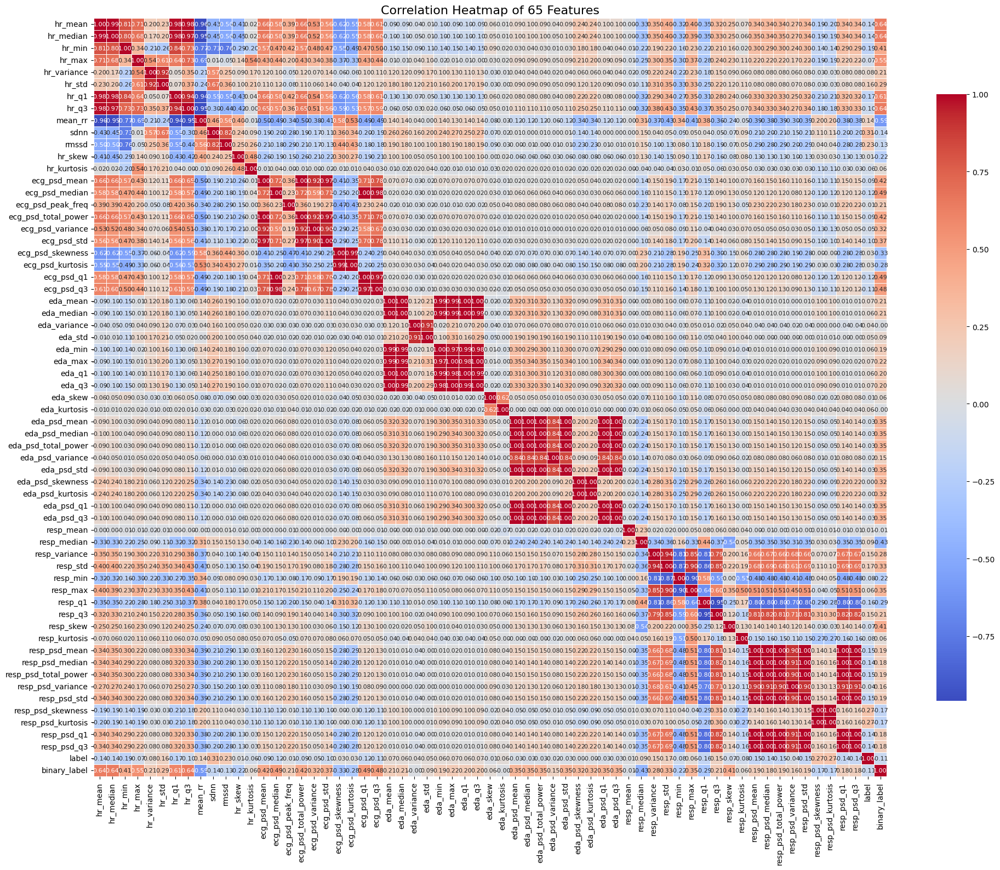

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = features_df_60_30.corr()

# Set figure size to accommodate the number of features
plt.figure(figsize=(20, 16))

# Create the heatmap with the correlation matrix
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', 
            linewidths=0.5, annot_kws={"size": 8}, cbar_kws={"shrink": 0.8})

# Rotate labels for better visibility
plt.xticks(rotation=90, ha='center')
plt.yticks(rotation=0, ha='right')

# Add title and show the plot
title="Correlation Heatmap of 65 Features"
plt.title("Correlation Heatmap of 65 Features", fontsize=16)
plt.tight_layout()  # Adjust layout to avoid label cut-off
plt.savefig(f'{title.lower().replace(" ", "_")}.png')
plt.show()


# TSNE Visualizations

In [63]:
def plot_tsne(X, y, title, labels):
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X)
    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='plasma', s=50, alpha=0.6)
    plt.title(title)
    plt.xlabel('tSNE-1')
    plt.ylabel('tSNE-2')
    plt.legend(handles=scatter.legend_elements()[0], labels=labels, title="Label")
    plt.savefig(f'{title.lower().replace(" ", "_")}.png')  # Save plot
    plt.show()

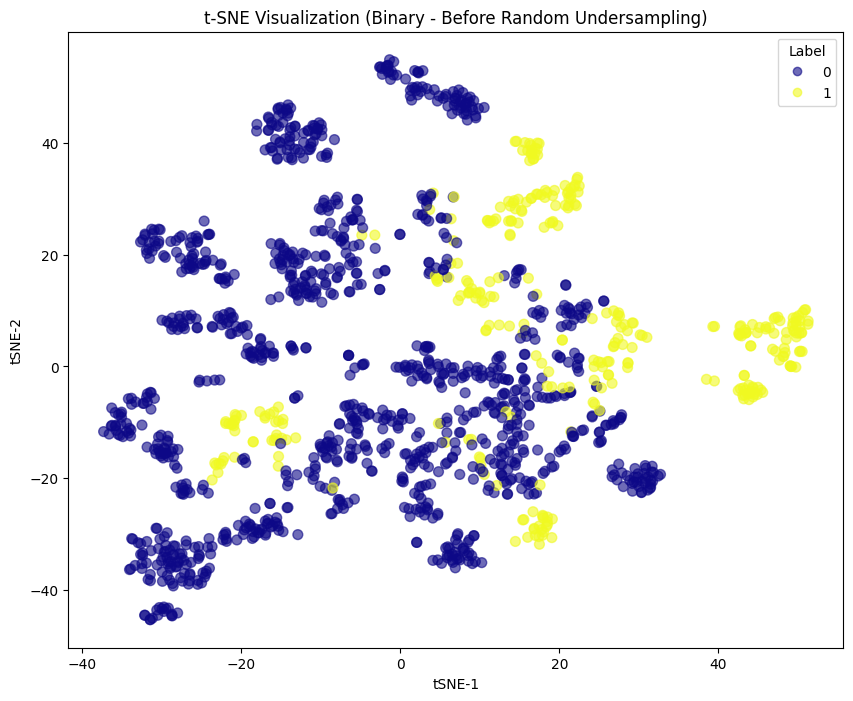

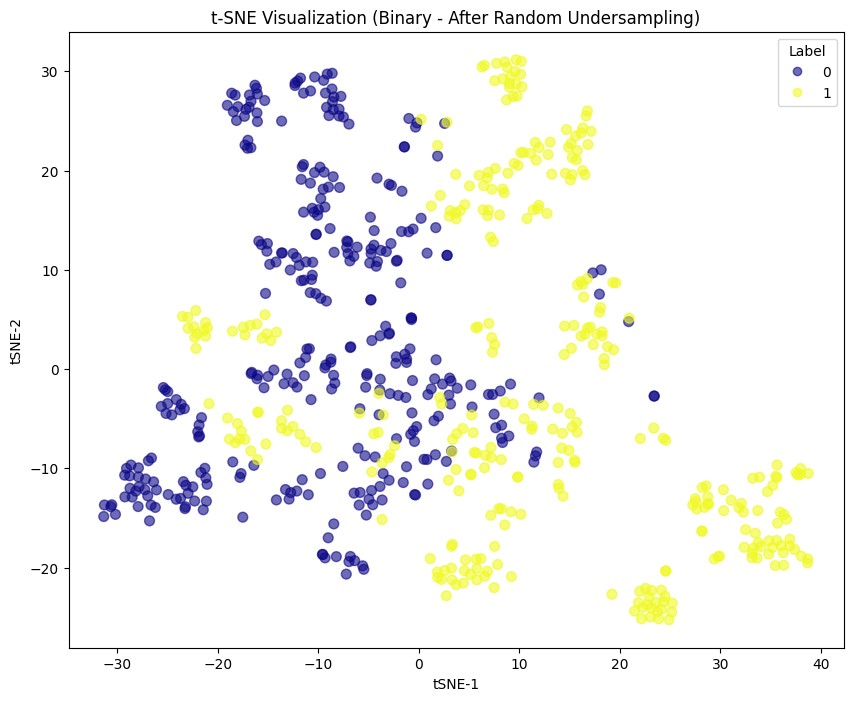

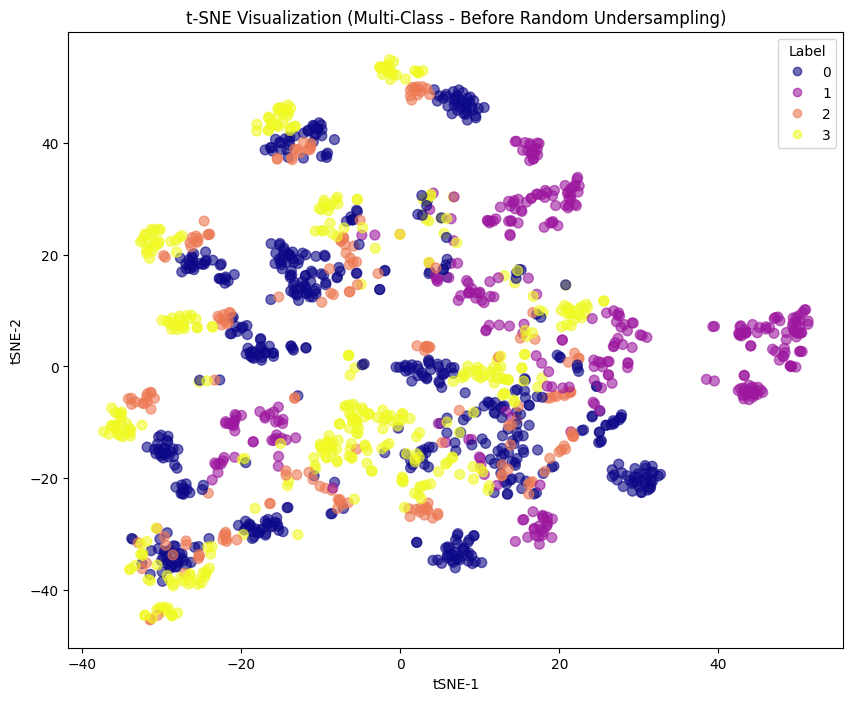

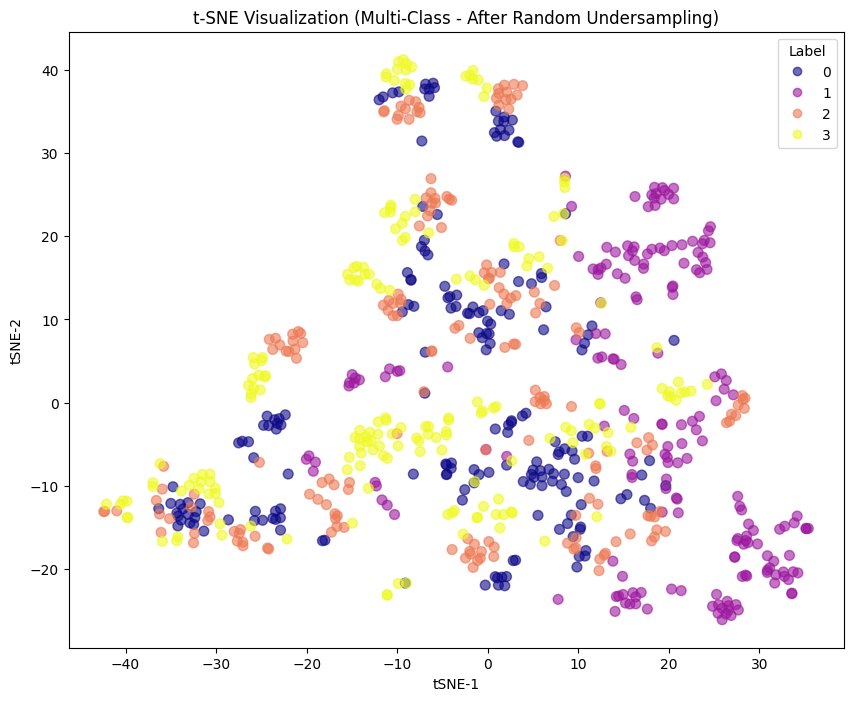

In [64]:
from imblearn.under_sampling import RandomUnderSampler

# Set random seed for reproducibility
np.random.seed(42)

# Prepare features (exclude label columns)
feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values

# Standardize features (to improve t-SNE performance for float data)
scaler = StandardScaler()
X = scaler.fit_transform(X)

y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before Random Undersampling
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before Random Undersampling)", labels=['0', '1'])

# Apply Random Undersampling (Binary)
rus_binary = RandomUnderSampler(random_state=42)
X_binary_rus, y_binary_rus = rus_binary.fit_resample(X, y_binary)

# After Random Undersampling (Binary)
plot_tsne(X_binary_rus, y_binary_rus, "t-SNE Visualization (Binary - After Random Undersampling)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before Random Undersampling
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before Random Undersampling)", labels=['0', '1', '2', '3'])

# Apply Random Undersampling (Multi-Class)
rus_multi = RandomUnderSampler(random_state=42)
X_multi_rus, y_multi_rus = rus_multi.fit_resample(X, y_multi)

# After Random Undersampling (Multi-Class)
plot_tsne(X_multi_rus, y_multi_rus, "t-SNE Visualization (Multi-Class - After Random Undersampling)", labels=['0', '1', '2', '3'])

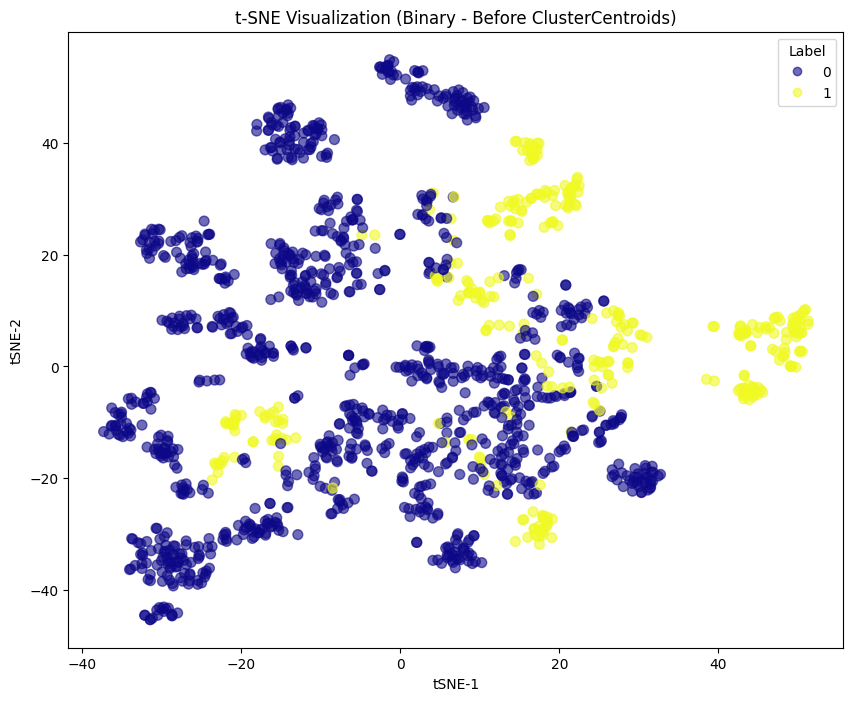

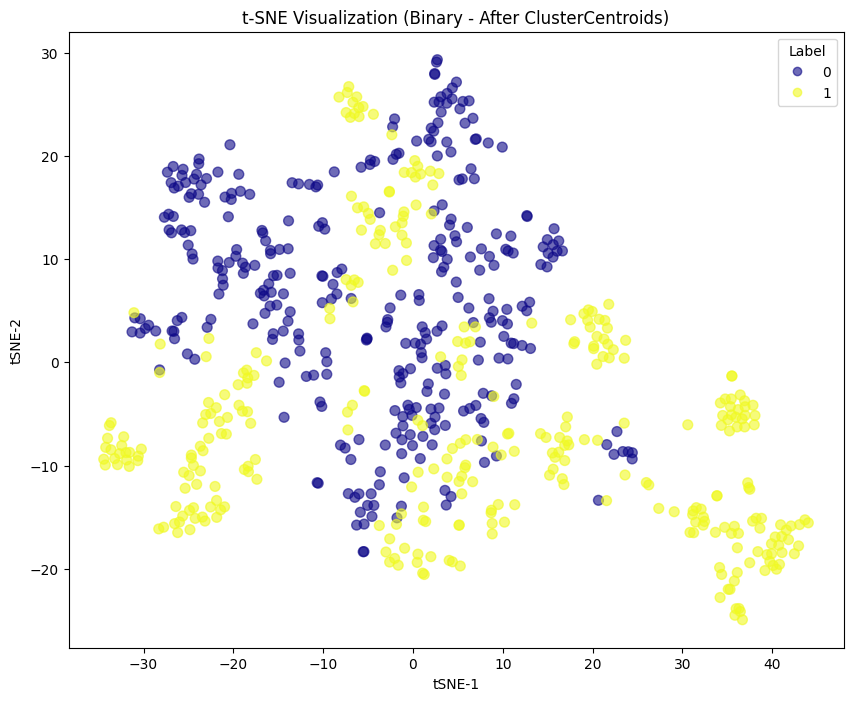

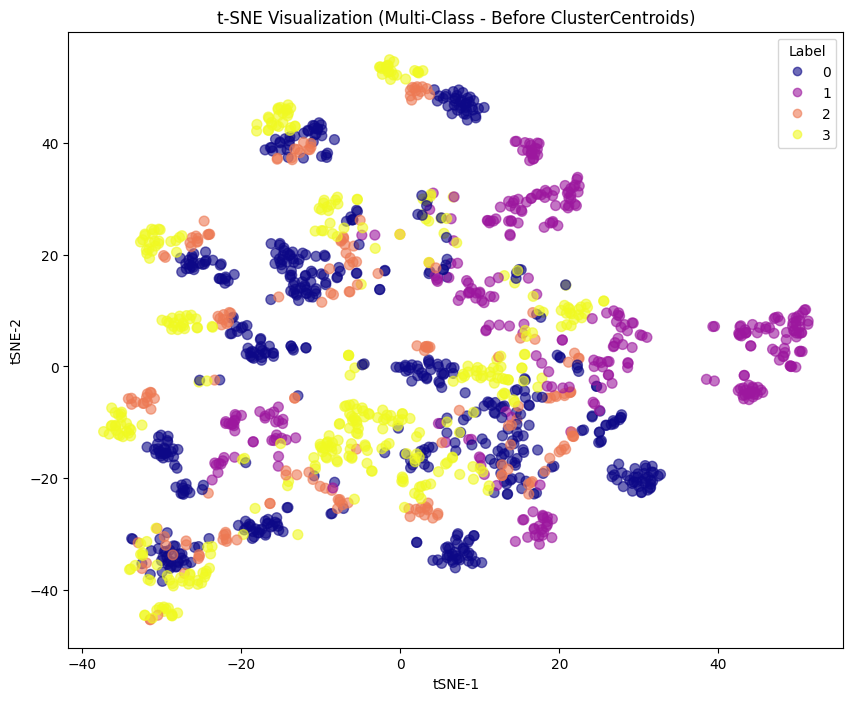

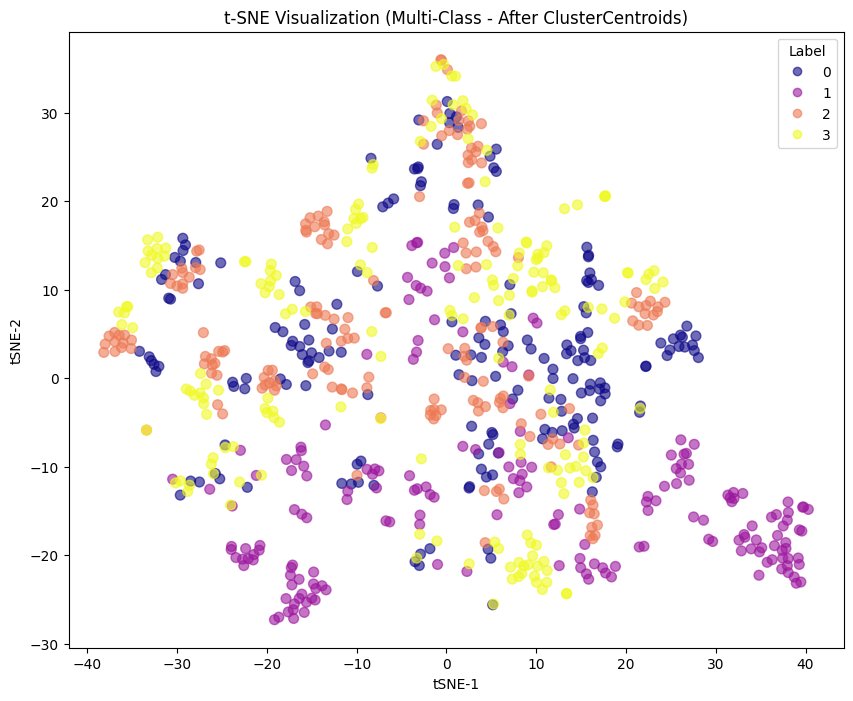

In [65]:
from imblearn.under_sampling import ClusterCentroids

# Set random seed for reproducibility
np.random.seed(42)
feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# Standardize features (optional, to improve clustering)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)

y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before ClusterCentroids
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before ClusterCentroids)", labels=['0', '1'])

# Apply ClusterCentroids (Binary)
clustercentroids_binary = ClusterCentroids(random_state=42)
X_binary_cluster, y_binary_cluster = clustercentroids_binary.fit_resample(X, y_binary)

# After ClusterCentroids (Binary)
plot_tsne(X_binary_cluster, y_binary_cluster, "t-SNE Visualization (Binary - After ClusterCentroids)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before ClusterCentroids
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before ClusterCentroids)", labels=['0', '1', '2', '3'])

# Apply ClusterCentroids (Multi-Class)
clustercentroids_multi = ClusterCentroids(random_state=42)
X_multi_cluster, y_multi_cluster = clustercentroids_multi.fit_resample(X, y_multi)

# After ClusterCentroids (Multi-Class)
plot_tsne(X_multi_cluster, y_multi_cluster, "t-SNE Visualization (Multi-Class - After ClusterCentroids)", labels=['0', '1', '2', '3'])

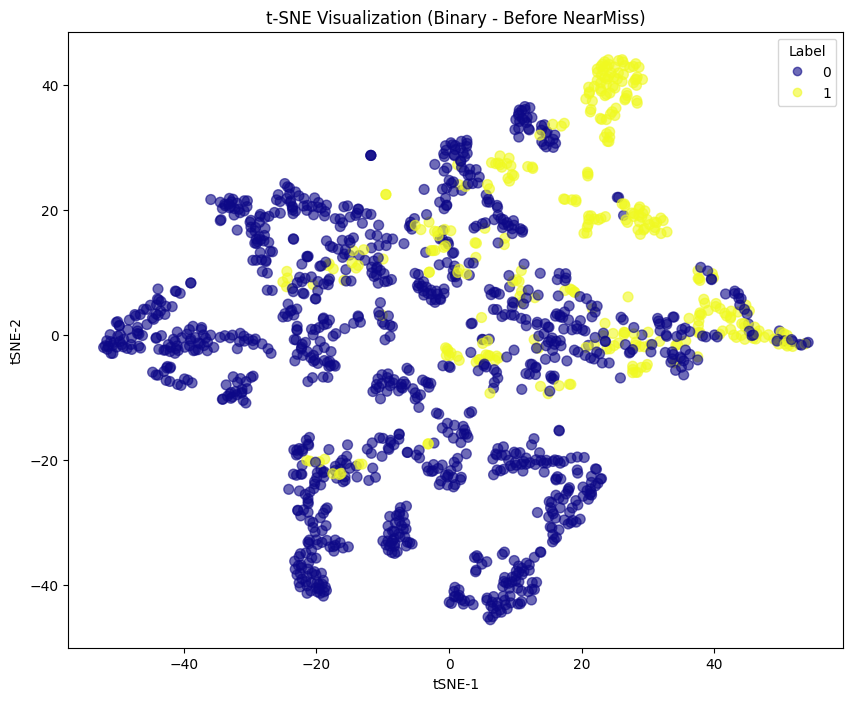

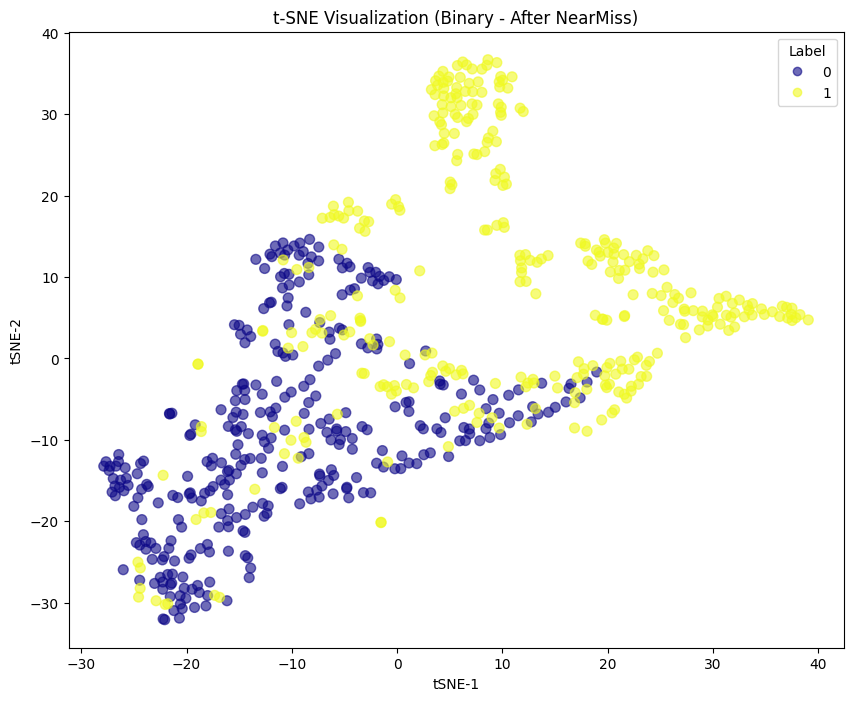

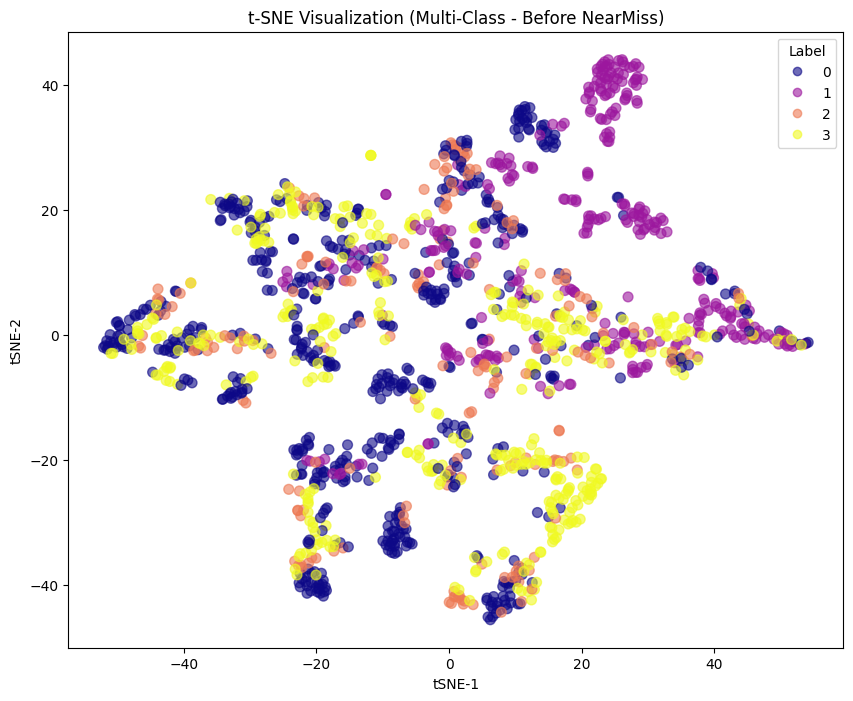

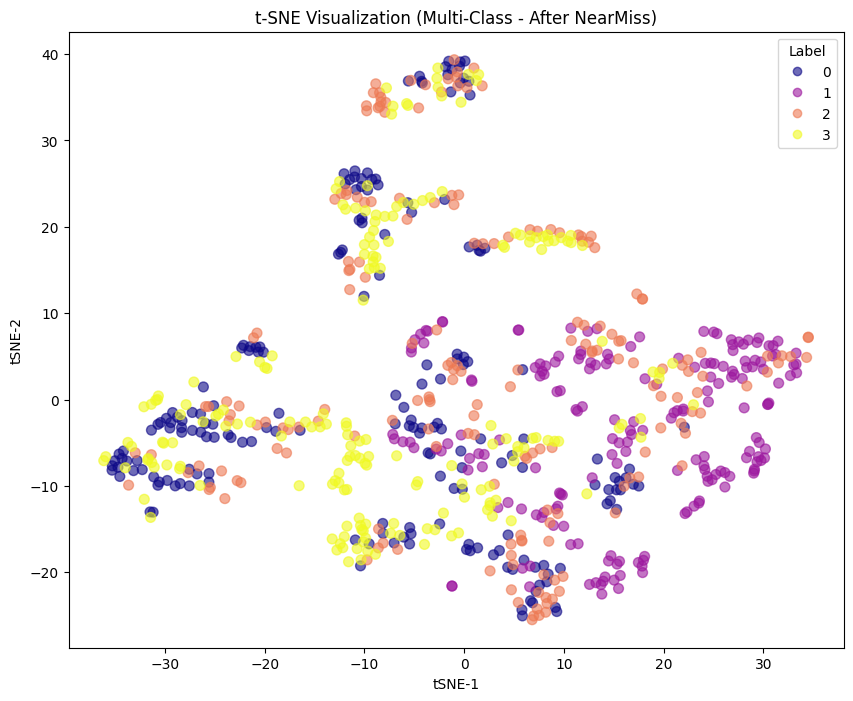

In [66]:
from imblearn.under_sampling import NearMiss

# Set random seed for reproducibility
np.random.seed(42)

feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before NearMiss
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before NearMiss)", labels=['0', '1'])

# Apply NearMiss (Binary)
nearmiss_binary = NearMiss(version=1)
X_binary_nearmiss, y_binary_nearmiss = nearmiss_binary.fit_resample(X, y_binary)

# After NearMiss (Binary)
plot_tsne(X_binary_nearmiss, y_binary_nearmiss, "t-SNE Visualization (Binary - After NearMiss)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before NearMiss
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before NearMiss)", labels=['0', '1', '2', '3'])

# Apply NearMiss (Multi-Class)
nearmiss_multi = NearMiss(version=1)
X_multi_nearmiss, y_multi_nearmiss = nearmiss_multi.fit_resample(X, y_multi)

# After NearMiss (Multi-Class)
plot_tsne(X_multi_nearmiss, y_multi_nearmiss, "t-SNE Visualization (Multi-Class - After NearMiss)", labels=['0', '1', '2', '3'])

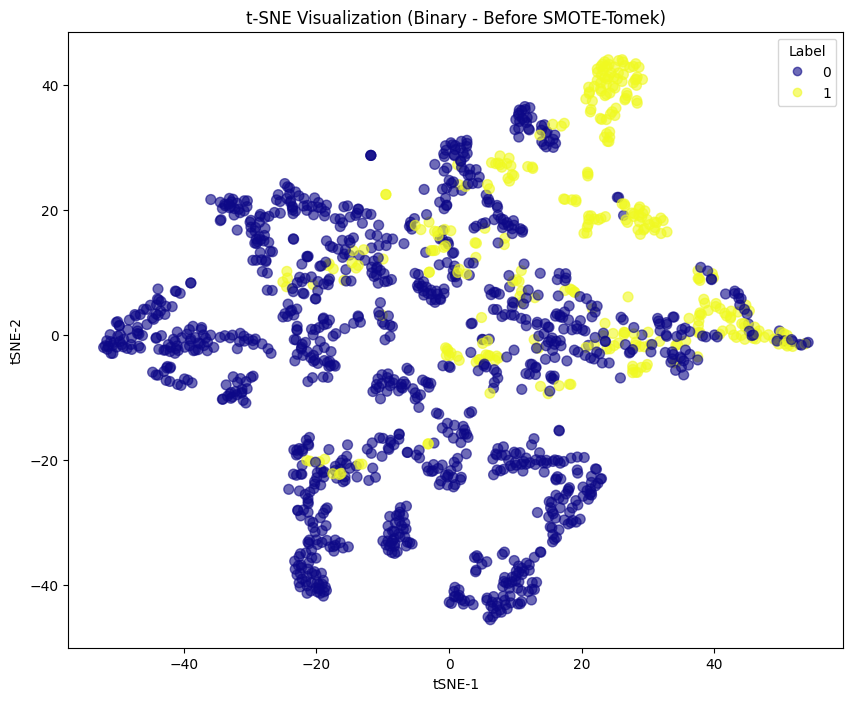

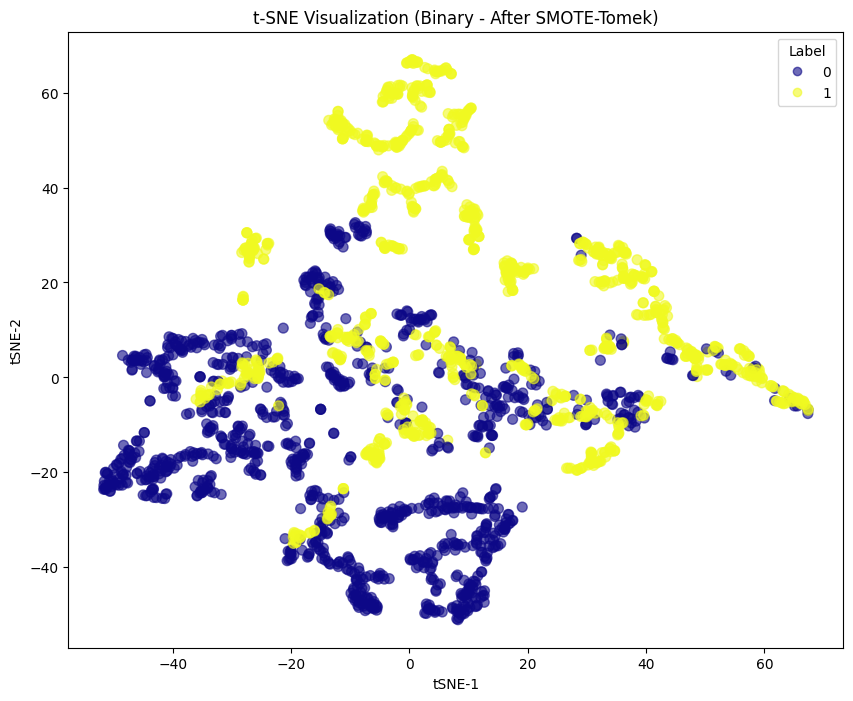

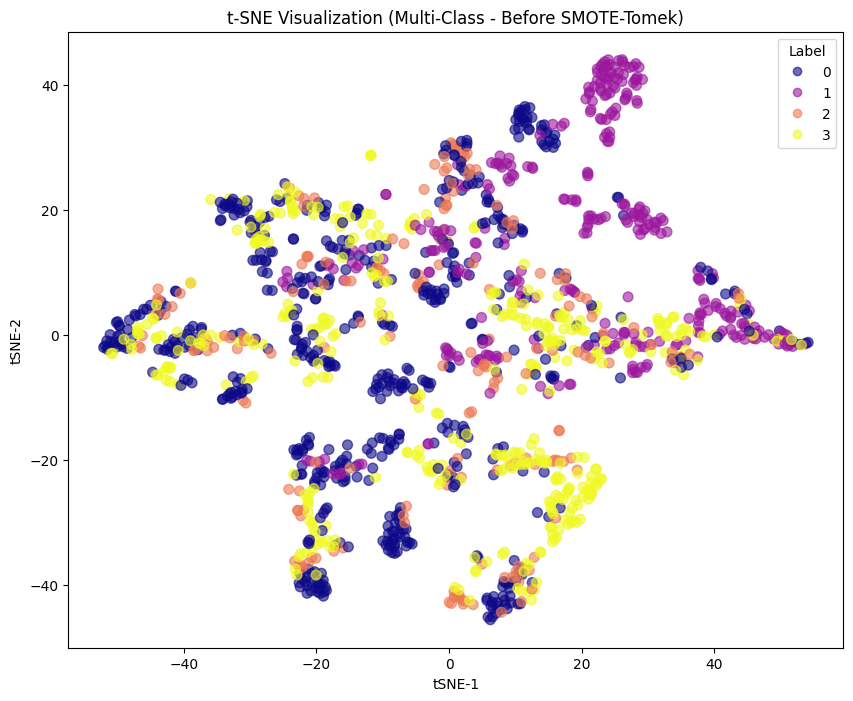

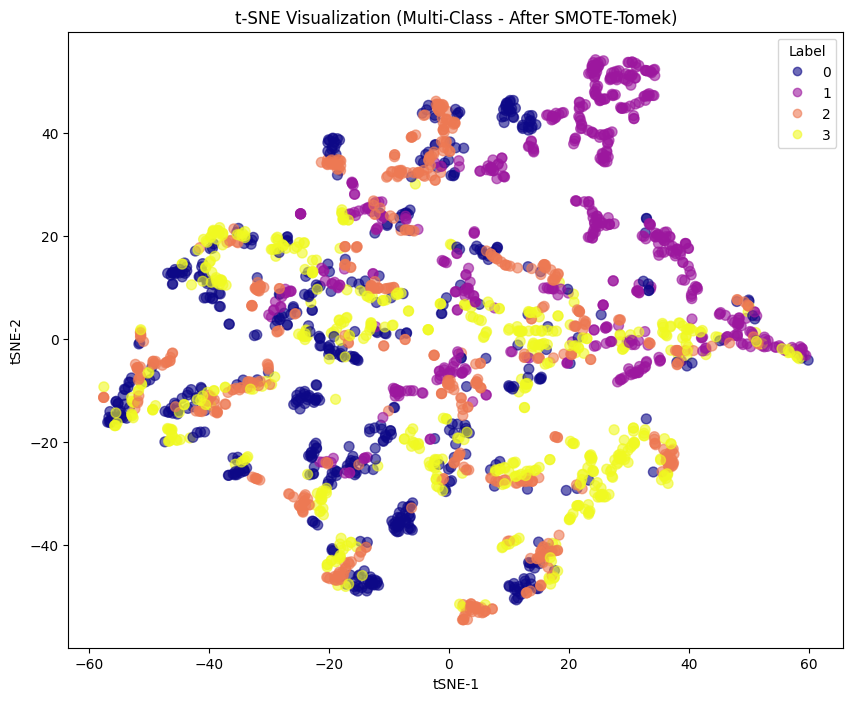

In [67]:
from imblearn.combine import SMOTETomek

# Set random seed for reproducibility
np.random.seed(42)

feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before SMOTE-Tomek
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before SMOTE-Tomek)", labels=['0', '1'])

# Apply SMOTE-Tomek (Binary)
smotetomek_binary = SMOTETomek(random_state=42)
X_binary_smotetomek, y_binary_smotetomek = smotetomek_binary.fit_resample(X, y_binary)

# After SMOTE-Tomek (Binary)
plot_tsne(X_binary_smotetomek, y_binary_smotetomek, "t-SNE Visualization (Binary - After SMOTE-Tomek)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before SMOTE-Tomek
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before SMOTE-Tomek)", labels=['0', '1', '2', '3'])

# Apply SMOTE-Tomek (Multi-Class)
smotetomek_multi = SMOTETomek(random_state=42)
X_multi_smotetomek, y_multi_smotetomek = smotetomek_multi.fit_resample(X, y_multi)

# After SMOTE-Tomek (Multi-Class)
plot_tsne(X_multi_smotetomek, y_multi_smotetomek, "t-SNE Visualization (Multi-Class - After SMOTE-Tomek)", labels=['0', '1', '2', '3'])

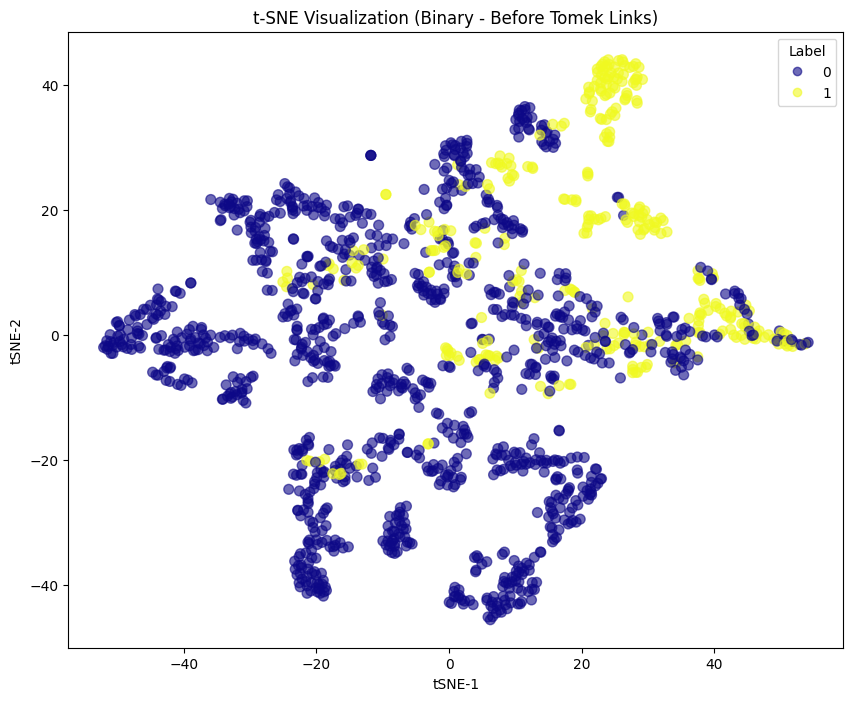

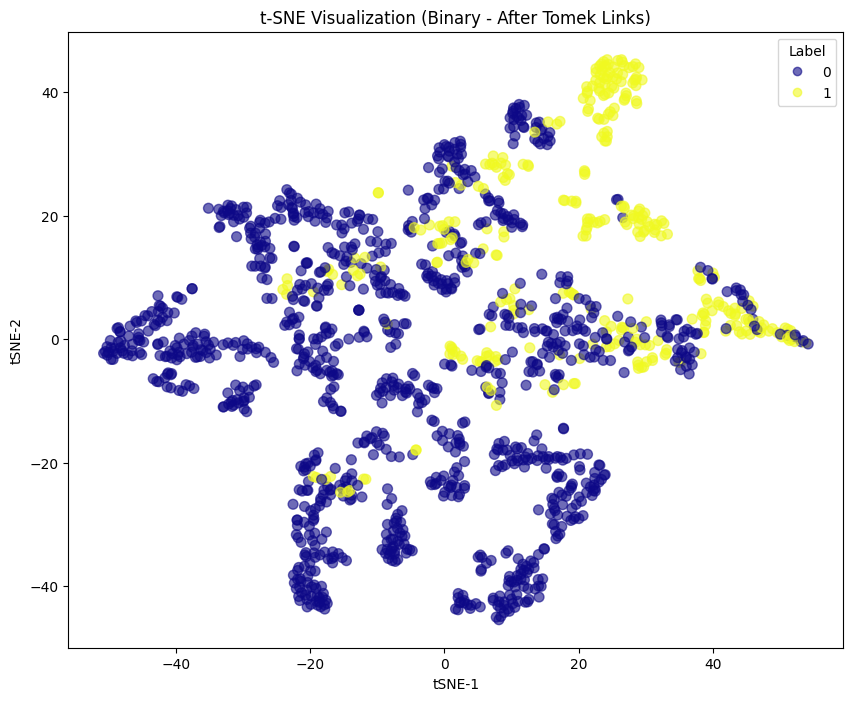

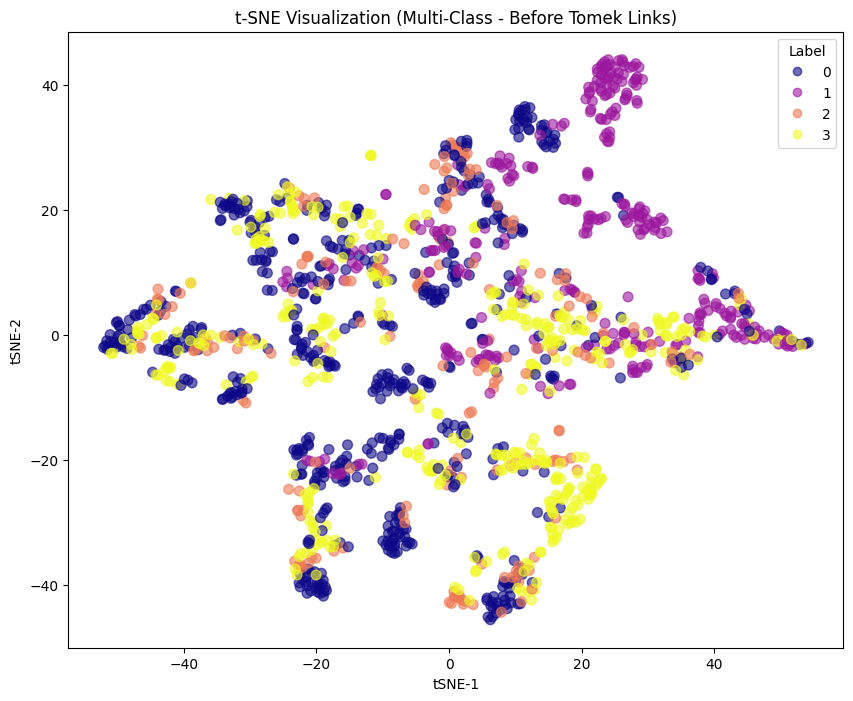

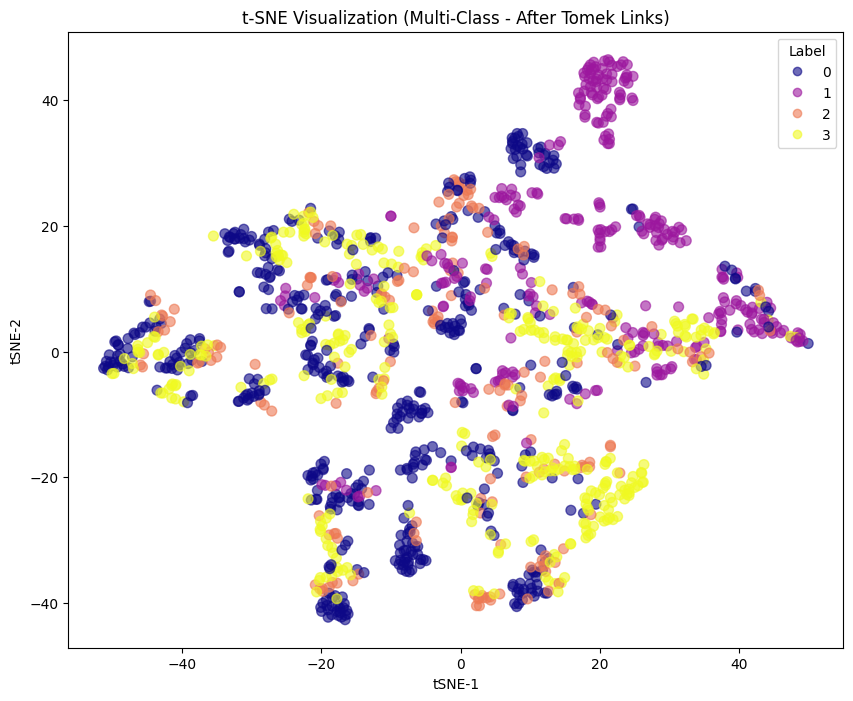

In [68]:
from imblearn.under_sampling import TomekLinks

# Set random seed for reproducibility
np.random.seed(42)
# Prepare features (exclude label columns)
feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before Tomek Links
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before Tomek Links)", labels=['0', '1'])

# Apply Tomek Links (Binary)
tomek_binary = TomekLinks()
X_binary_tomek, y_binary_tomek = tomek_binary.fit_resample(X, y_binary)

# After Tomek Links (Binary)
plot_tsne(X_binary_tomek, y_binary_tomek, "t-SNE Visualization (Binary - After Tomek Links)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before Tomek Links
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before Tomek Links)", labels=['0', '1', '2', '3'])

# Apply Tomek Links (Multi-Class)
tomek_multi = TomekLinks()
X_multi_tomek, y_multi_tomek = tomek_multi.fit_resample(X, y_multi)

# After Tomek Links (Multi-Class)
plot_tsne(X_multi_tomek, y_multi_tomek, "t-SNE Visualization (Multi-Class - After Tomek Links)", labels=['0', '1', '2', '3'])

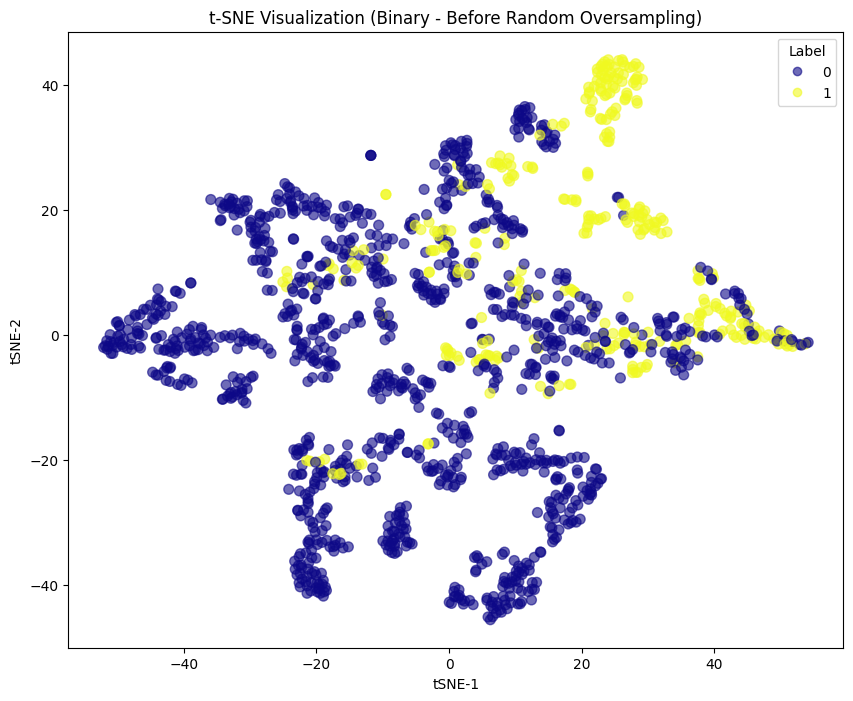

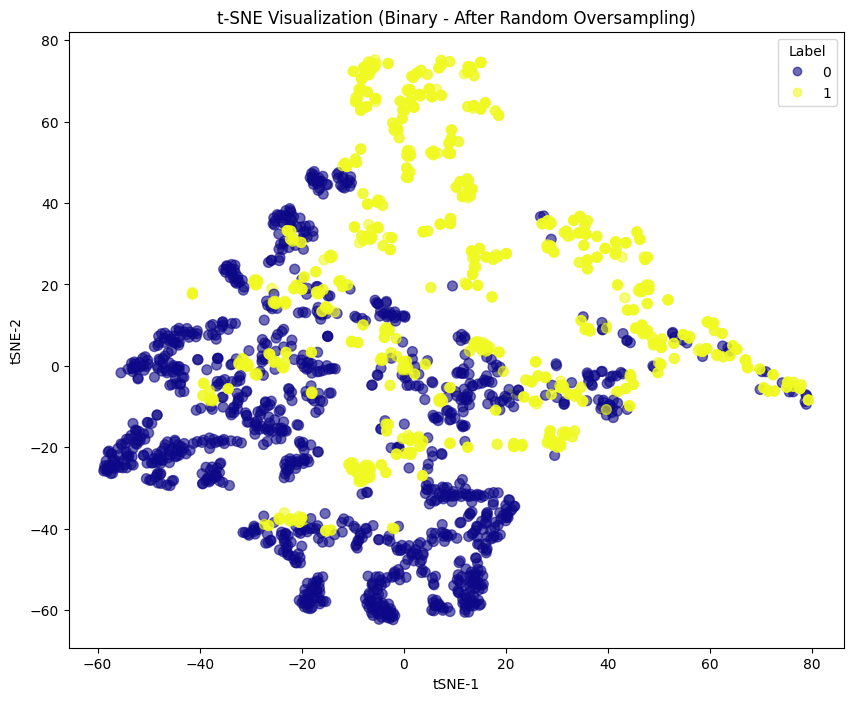

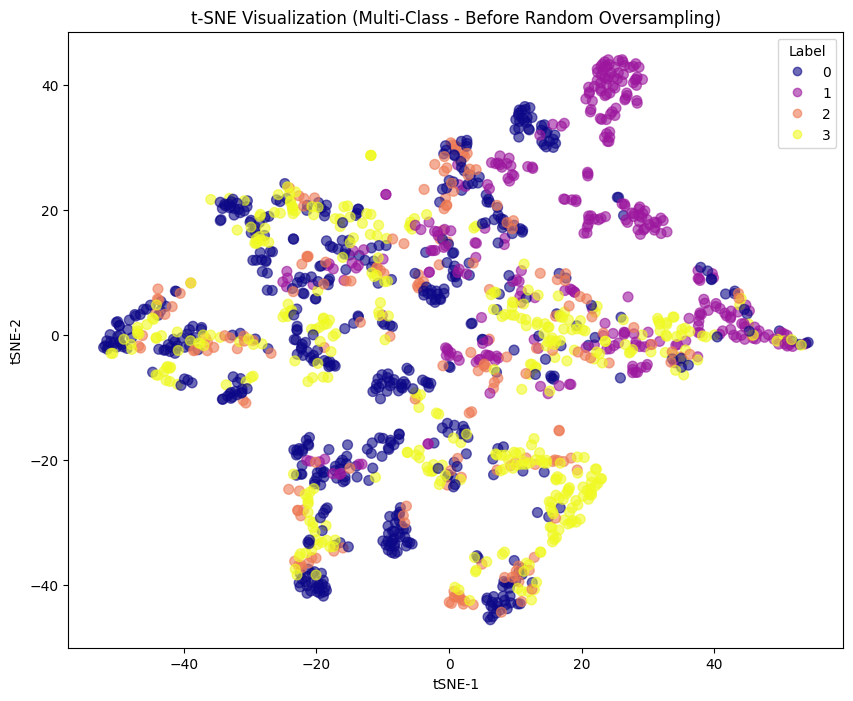

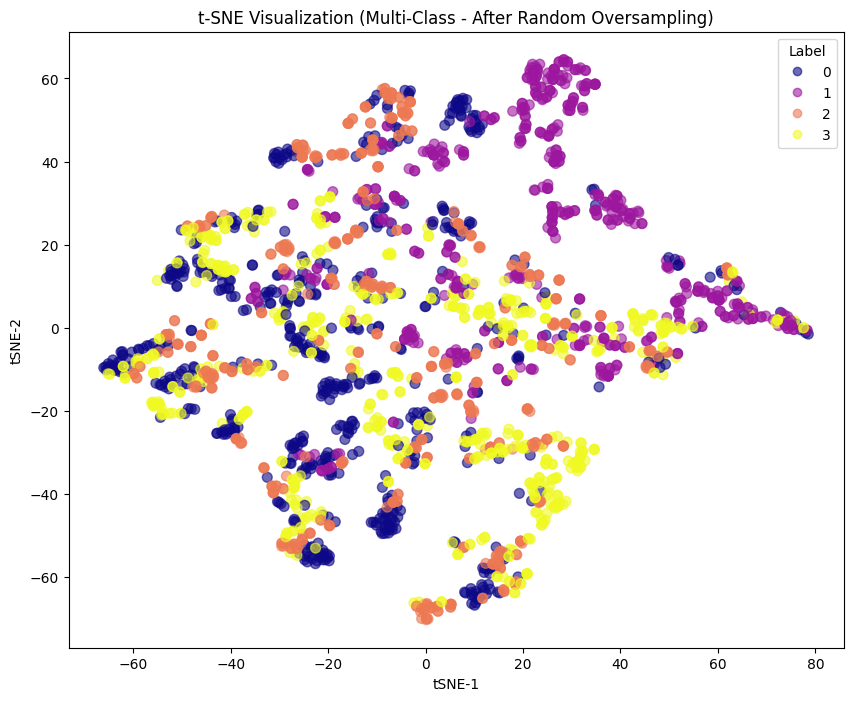

In [69]:
from imblearn.over_sampling import RandomOverSampler

# Set random seed for reproducibility
np.random.seed(42)
# Prepare features (exclude label columns)
feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before Random Oversampling
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before Random Oversampling)", labels=['0', '1'])

# Apply Random Oversampling (Binary)
random_oversampler_binary = RandomOverSampler(random_state=42)
X_binary_random, y_binary_random = random_oversampler_binary.fit_resample(X, y_binary)

# After Random Oversampling (Binary)
plot_tsne(X_binary_random, y_binary_random, "t-SNE Visualization (Binary - After Random Oversampling)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before Random Oversampling
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before Random Oversampling)", labels=['0', '1', '2', '3'])

# Apply Random Oversampling (Multi-Class)
random_oversampler_multi = RandomOverSampler(random_state=42)
X_multi_random, y_multi_random = random_oversampler_multi.fit_resample(X, y_multi)

# After Random Oversampling (Multi-Class)
plot_tsne(X_multi_random, y_multi_random, "t-SNE Visualization (Multi-Class - After Random Oversampling)", labels=['0', '1', '2', '3'])

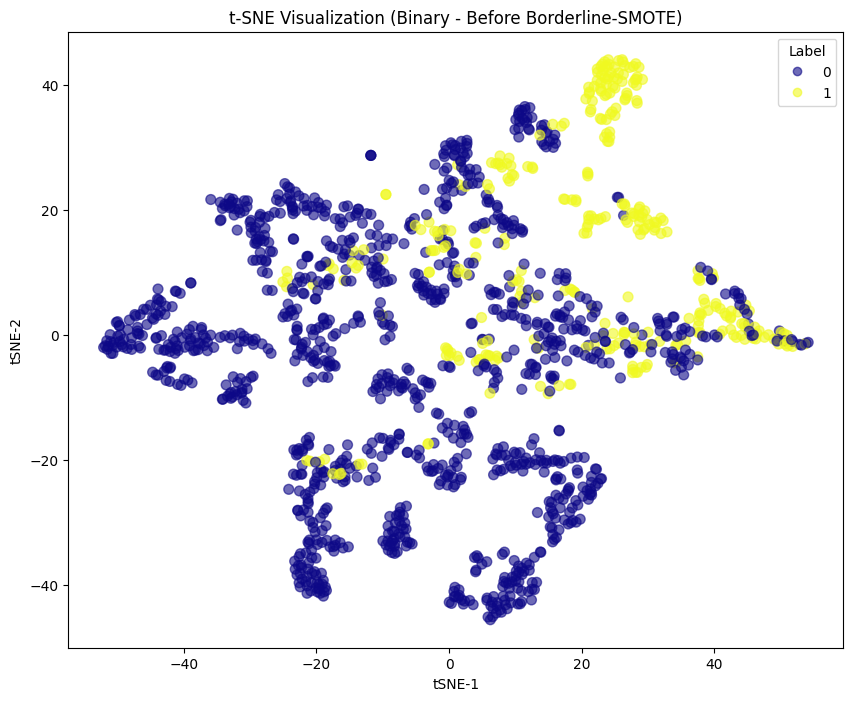

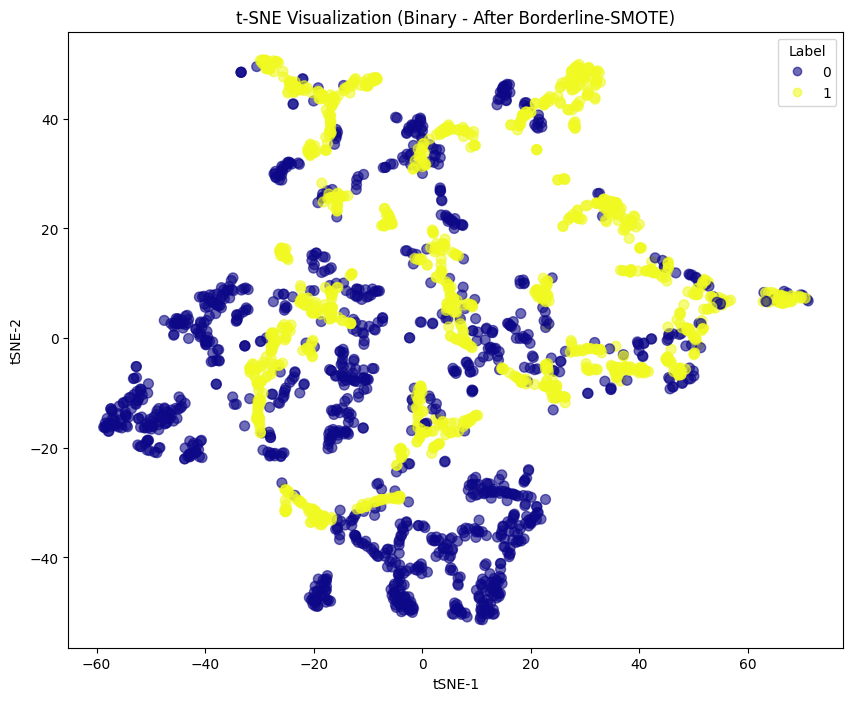

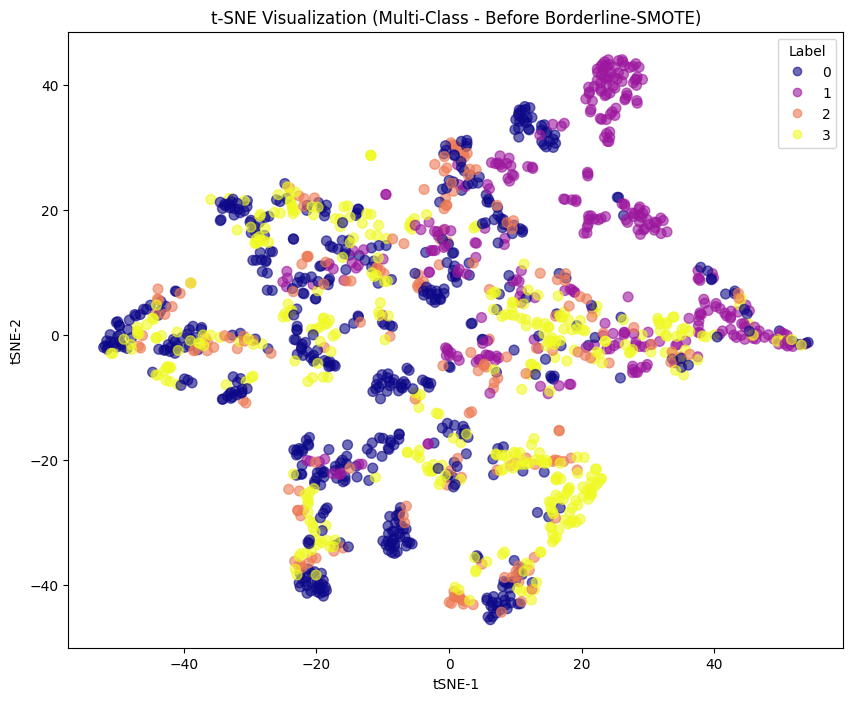

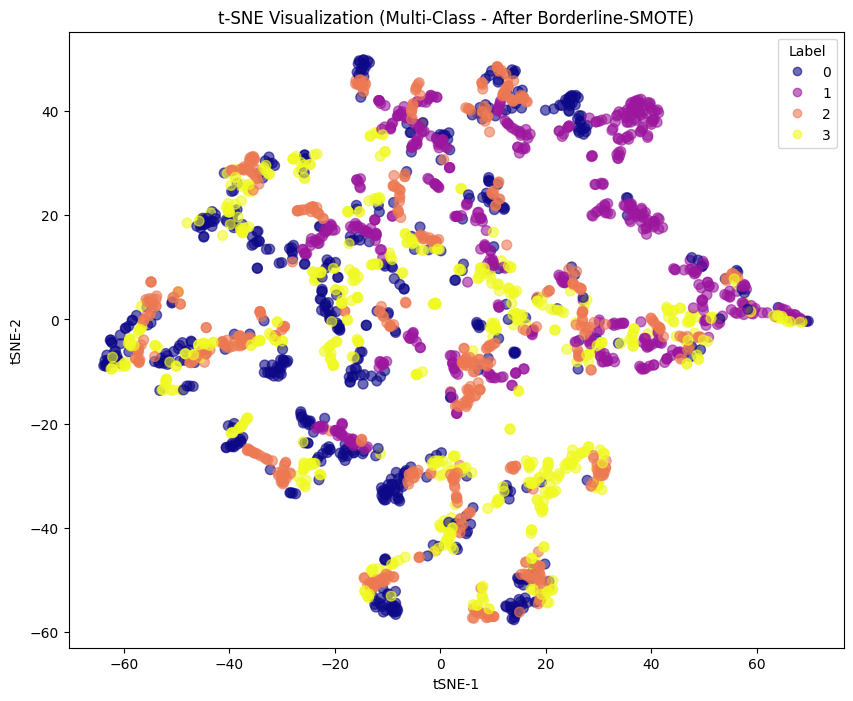

In [70]:
from imblearn.over_sampling import BorderlineSMOTE

# Set random seed for reproducibility
np.random.seed(42)

# Function to plot t-SNE visualization

# Assuming features_df_60_30 is your DataFrame with features and labels
# Prepare features (exclude label columns)
feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before Borderline-SMOTE
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before Borderline-SMOTE)", labels=['0', '1'])

# Apply Borderline-SMOTE (Binary)
borderline_smote_binary = BorderlineSMOTE(random_state=42)
X_binary_borderline, y_binary_borderline = borderline_smote_binary.fit_resample(X, y_binary)

# After Borderline-SMOTE (Binary)
plot_tsne(X_binary_borderline, y_binary_borderline, "t-SNE Visualization (Binary - After Borderline-SMOTE)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before Borderline-SMOTE
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before Borderline-SMOTE)", labels=['0', '1', '2', '3'])

# Apply Borderline-SMOTE (Multi-Class)
borderline_smote_multi = BorderlineSMOTE(random_state=42)
X_multi_borderline, y_multi_borderline = borderline_smote_multi.fit_resample(X, y_multi)

# After Borderline-SMOTE (Multi-Class)
plot_tsne(X_multi_borderline, y_multi_borderline, "t-SNE Visualization (Multi-Class - After Borderline-SMOTE)", labels=['0', '1', '2', '3'])

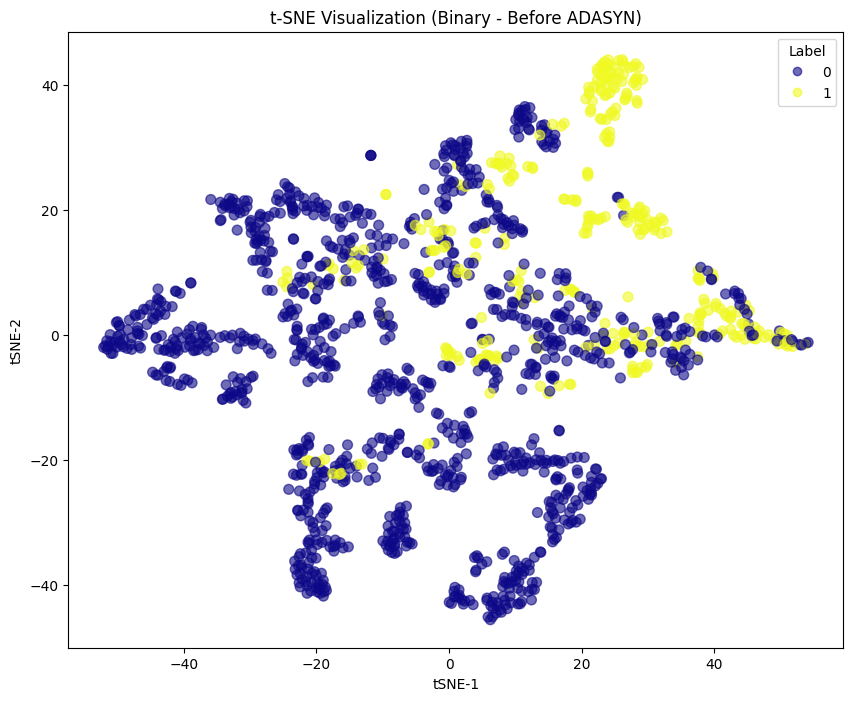

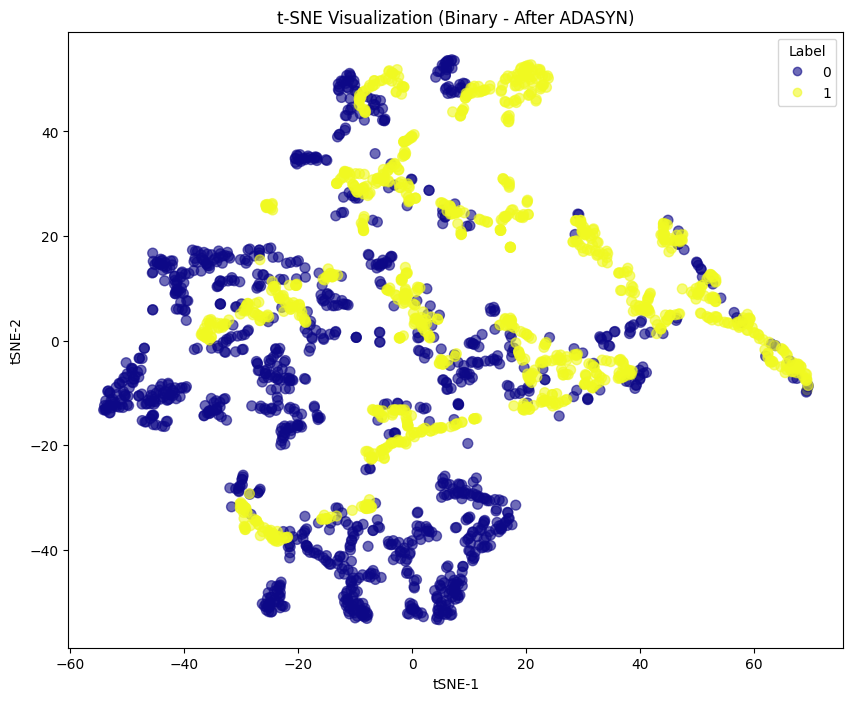

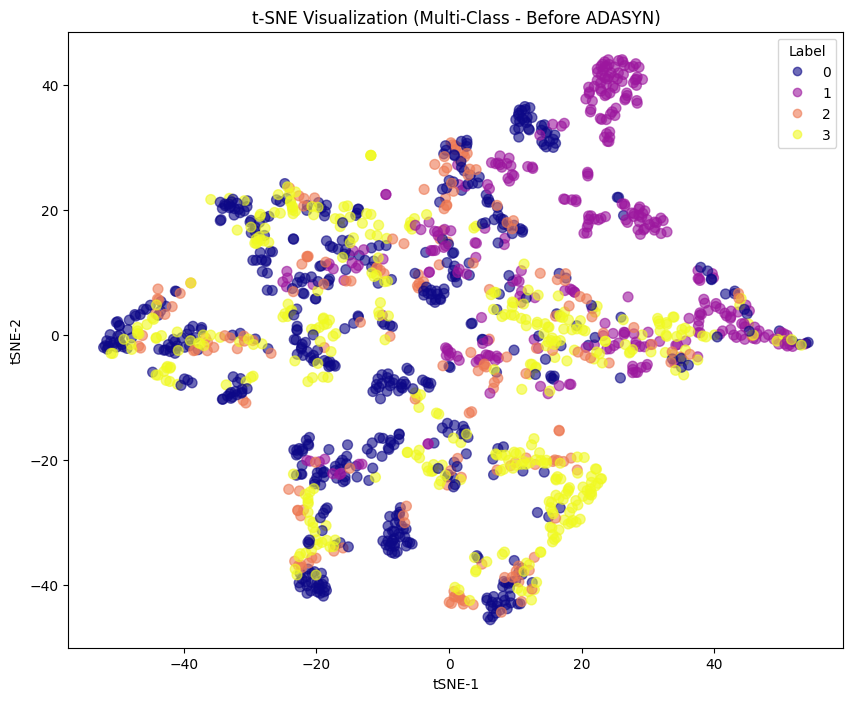

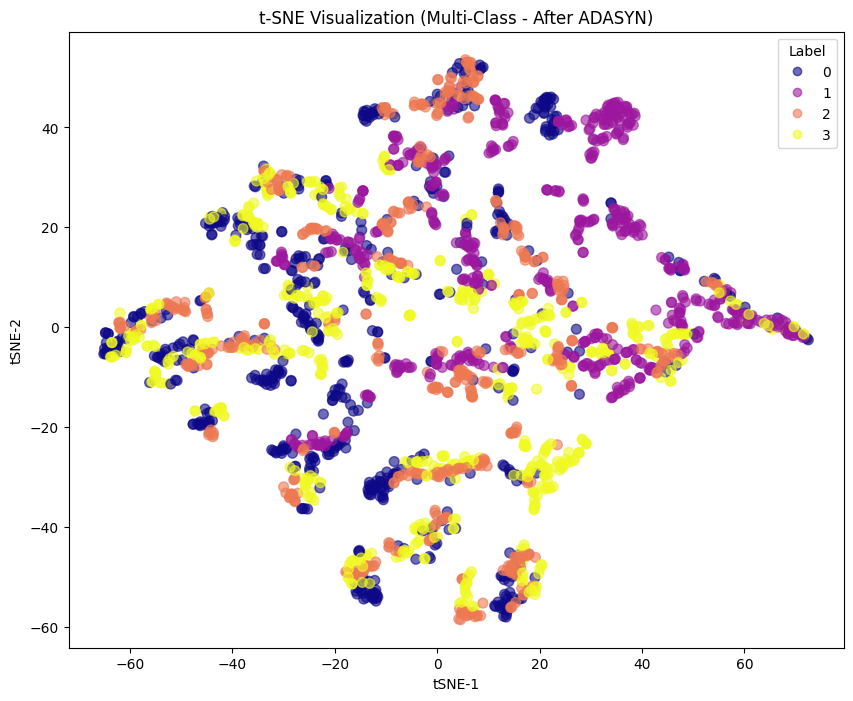

In [71]:
from imblearn.over_sampling import ADASYN

# Set random seed for reproducibility
np.random.seed(42)

# Assuming features_df_60_30 is your DataFrame with features and labels
# Prepare features (exclude label columns)
feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before ADASYN
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before ADASYN)", labels=['0', '1'])

# Apply ADASYN (Binary)
adasyn_binary = ADASYN(random_state=42)
X_binary_adasyn, y_binary_adasyn = adasyn_binary.fit_resample(X, y_binary)

# After ADASYN (Binary)
plot_tsne(X_binary_adasyn, y_binary_adasyn, "t-SNE Visualization (Binary - After ADASYN)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before ADASYN
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before ADASYN)", labels=['0', '1', '2', '3'])

# Apply ADASYN (Multi-Class)
adasyn_multi = ADASYN(random_state=42)
X_multi_adasyn, y_multi_adasyn = adasyn_multi.fit_resample(X, y_multi)

# After ADASYN (Multi-Class)
plot_tsne(X_multi_adasyn, y_multi_adasyn, "t-SNE Visualization (Multi-Class - After ADASYN)", labels=['0', '1', '2', '3'])

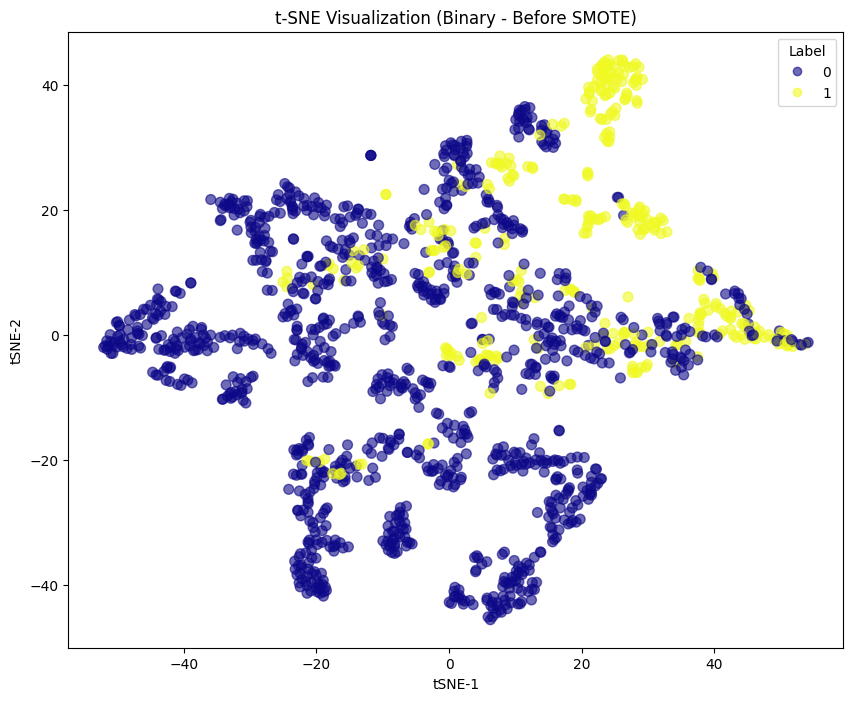

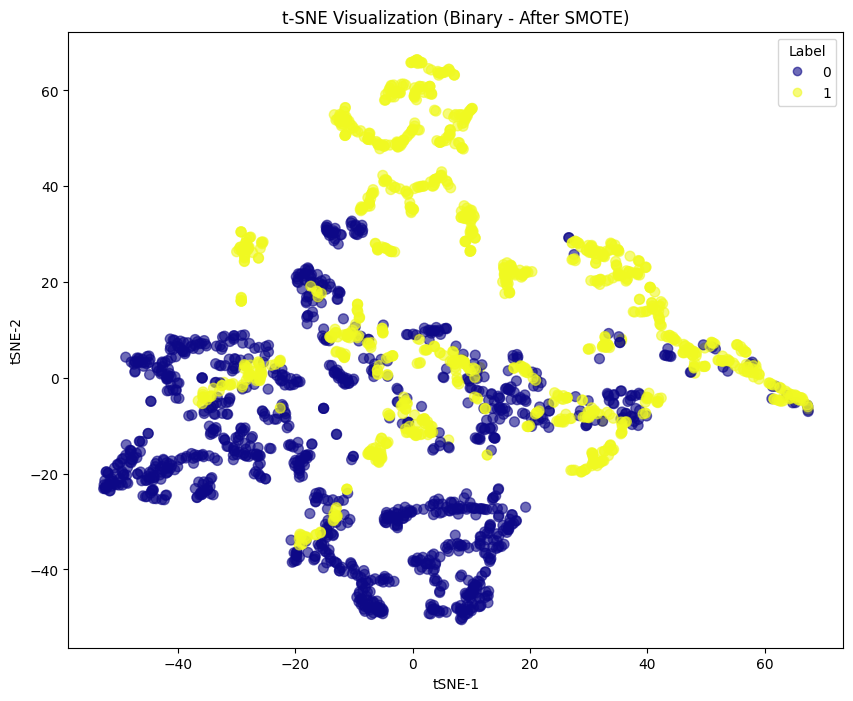

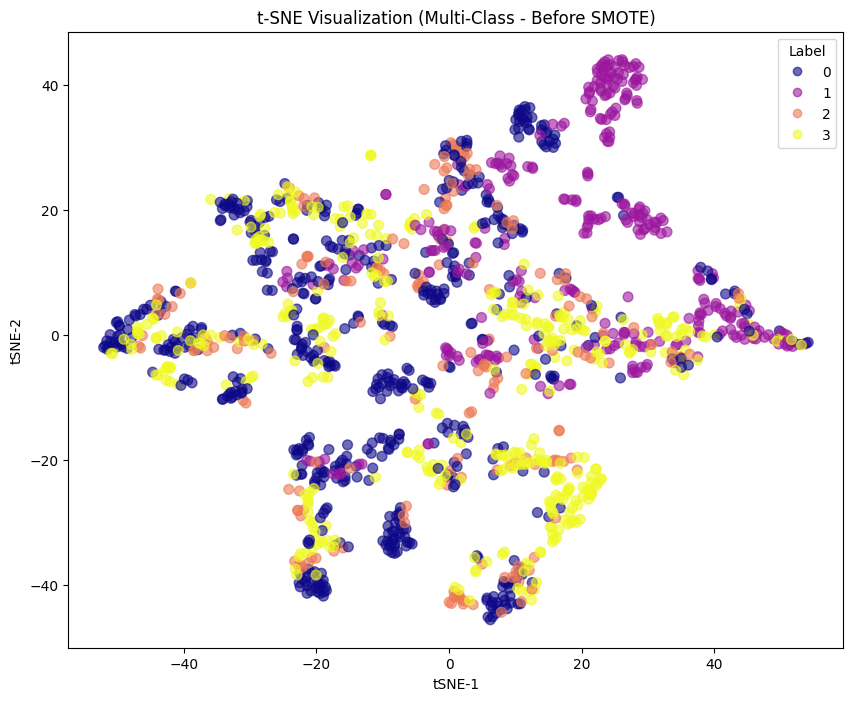

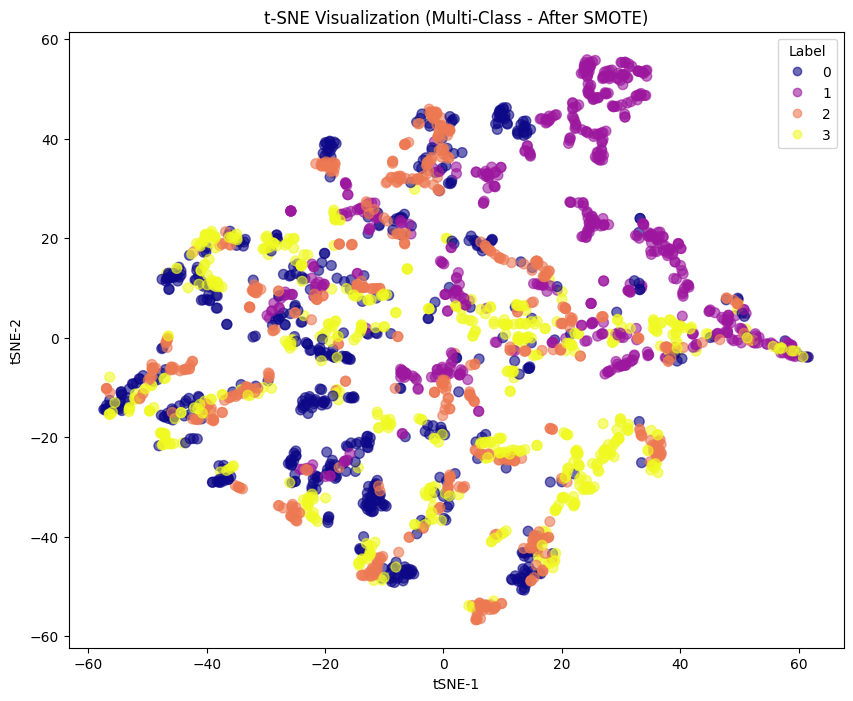

In [72]:
# Set random seed for reproducibility
np.random.seed(42)
# Prepare features (exclude label columns)
feature_cols = [col for col in features_df_60_30.columns if col not in ['label', 'binary_label']]
X = features_df_60_30[feature_cols].values
y_binary = features_df_60_30['binary_label'].values
y_multi = features_df_60_30['label'].values

# 1. Binary Classification (using binary_label)
# Before SMOTE
plot_tsne(X, y_binary, "t-SNE Visualization (Binary - Before SMOTE)", labels=['0', '1'])

# Apply SMOTE (Binary)
smote_binary = SMOTE(random_state=42)
X_binary_smote, y_binary_smote = smote_binary.fit_resample(X, y_binary)

# After SMOTE (Binary)
plot_tsne(X_binary_smote, y_binary_smote, "t-SNE Visualization (Binary - After SMOTE)", labels=['0', '1'])

# 2. Multi-Class Classification (using label)
# Before SMOTE
plot_tsne(X, y_multi, "t-SNE Visualization (Multi-Class - Before SMOTE)", labels=['0', '1', '2', '3'])

# Apply SMOTE (Multi-Class)
smote_multi = SMOTE(random_state=42)
X_multi_smote, y_multi_smote = smote_multi.fit_resample(X, y_multi)

# After SMOTE (Multi-Class)
plot_tsne(X_multi_smote, y_multi_smote, "t-SNE Visualization (Multi-Class - After SMOTE)", labels=['0', '1', '2', '3'])

In [73]:
X = features_df_60_30.drop(['label', 'binary_label'], axis=1)
y = features_df_60_30['label'].astype(float)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [74]:
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)


Multi

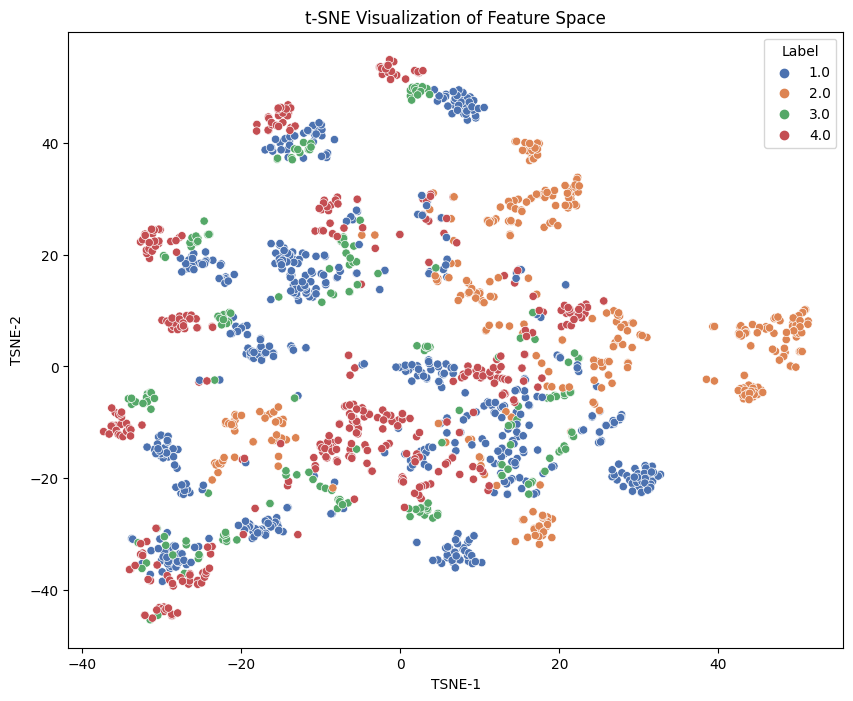

In [75]:
# Create a DataFrame for plotting
tsne_df = pd.DataFrame({
    'TSNE-1': X_tsne[:, 0],
    'TSNE-2': X_tsne[:, 1],
    'Label': y
})

plt.figure(figsize=(10, 8))
sns.scatterplot(data=tsne_df, x='TSNE-1', y='TSNE-2', hue='Label', palette='deep')
plt.title('t-SNE Visualization of Feature Space')
plt.show()

* Label 1.0 (blue) and label 4.0 (red) points are more spread out, with some overlap in certain regions.
* Label 2.0 (orange) forms a tight cluster on the right side, suggesting strong similarity within this group.
* Label 3.0 (green) points are scattered but tend to cluster near the center-left.

In [76]:
X = features_df_60_30.drop(['label', 'binary_label'], axis=1)
y = features_df_60_30['binary_label'].astype(float)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [77]:
tsne = TSNE(n_components=3, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

Binary

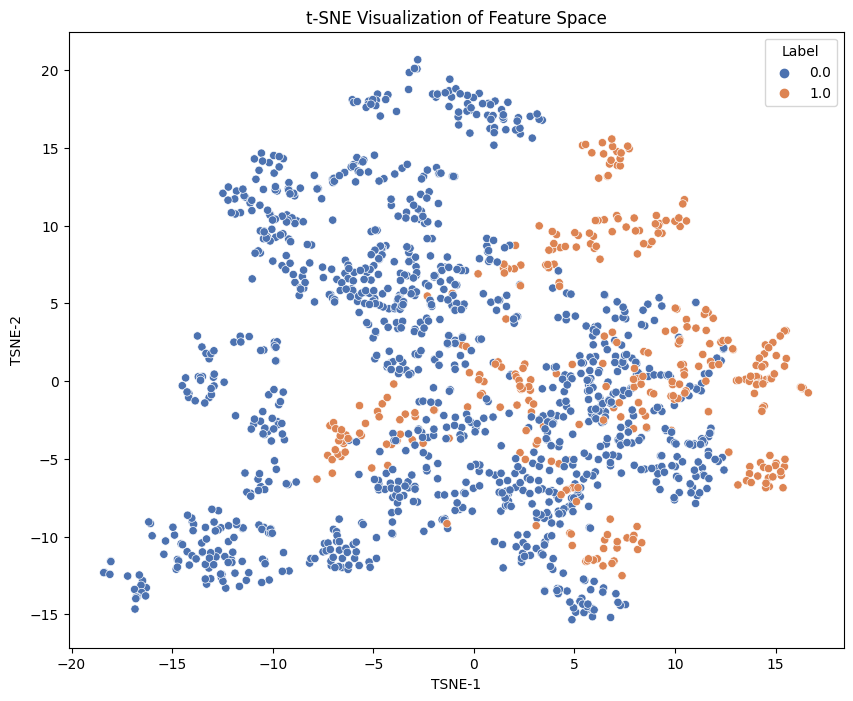

In [78]:
# Create a DataFrame for plotting
tsne_df = pd.DataFrame({
    'TSNE-1': X_tsne[:, 0],
    'TSNE-2': X_tsne[:, 1],
    'Label': y
})

plt.figure(figsize=(10, 8))
sns.scatterplot(data=tsne_df, x='TSNE-1', y='TSNE-2', hue='Label', palette='deep')
plt.title('t-SNE Visualization of Feature Space')
plt.show()

# MACHINE LEARNING APPROACH

# Evaluation metrics

In [79]:
# Learning curves
def plot_learning_curve(estimator, X, y, filename):
    train_sizes, train_scores, val_scores = learning_curve(
        estimator, X, y, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
    )
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)
    
    plt.figure(figsize=(10, 6))
    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, val_mean, label='Cross-validation score')
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.1)
    plt.xlabel('Training Examples')
    plt.ylabel('Accuracy Score')
    plt.title('Learning Curves')
    plt.legend(loc='best')
    plt.grid(True)
    plt.savefig(filename)
    plt.show()

def plot_confusion_matrix(y_true, y_pred, title, filename):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.savefig(filename)
    plt.show()
def evaluate_classifier(
    model,
    X_train,
    y_train,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred,
    cv_folds=3,
    learning_curve_path='learning_curve.png',
    cm_train_path='Confusion_Matrix_train.png',
    cm_test_path='Confusion_Matrix_test.png'
):
    """
    Evaluates a classifier with classification reports, learning curve, confusion matrices,
    cross-validation scores, and accuracy metrics.
    
    Parameters:
    - model: Trained classifier (e.g., RandomForestClassifier)
    - X_train: Training features (float-based, e.g., WESAD PSD features)
    - y_train_resampled: Resampled training labels (e.g., after Random Undersampling)
    - y_train_pred: Predicted labels for training set
    - X_test: Test features
    - y_test: Test labels
    - y_test_pred: Predicted labels for test set
    - cv_folds: Number of cross-validation folds (default: 3)
    - learning_curve_path: Path to save learning curve plot
    - cm_train_path: Path to save train confusion matrix
    - cm_test_path: Path to save test confusion matrix
    """
    # Classification reports
    print("Train Classification Report:")
    print(classification_report(y_train, y_train_pred))
    print("Test Classification Report:")
    print(classification_report(y_test, y_test_pred))

    # Plot learning curve
    plot_learning_curve(model, X_train, y_train, learning_curve_path)

    # Plot confusion matrices
    plot_confusion_matrix(y_train, y_train_pred, 'Confusion Matrix - Train Set', cm_train_path)
    plot_confusion_matrix(y_test, y_test_pred, 'Confusion Matrix - Test Set', cm_test_path)

    # Cross-validation scores
    cv_scores = cross_val_score(model, X_train, y_train, cv=cv_folds, n_jobs=-1, scoring='accuracy')
    print("Cross-Validation Scores:", cv_scores)
    print("Mean CV Score:", np.mean(cv_scores))
    print("Standard Deviation:", np.std(cv_scores))

    # Train and Test Accuracy
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    print("Train Accuracy:", train_accuracy)
    print("Test Accuracy:", test_accuracy)


# LogisticRegression

# **60_30**

In [80]:
X = features_df_60_30.drop(['label', 'binary_label'], axis=1)
y = features_df_60_30['binary_label'].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# T0P 50 MOST IMPORTANT FEATURES

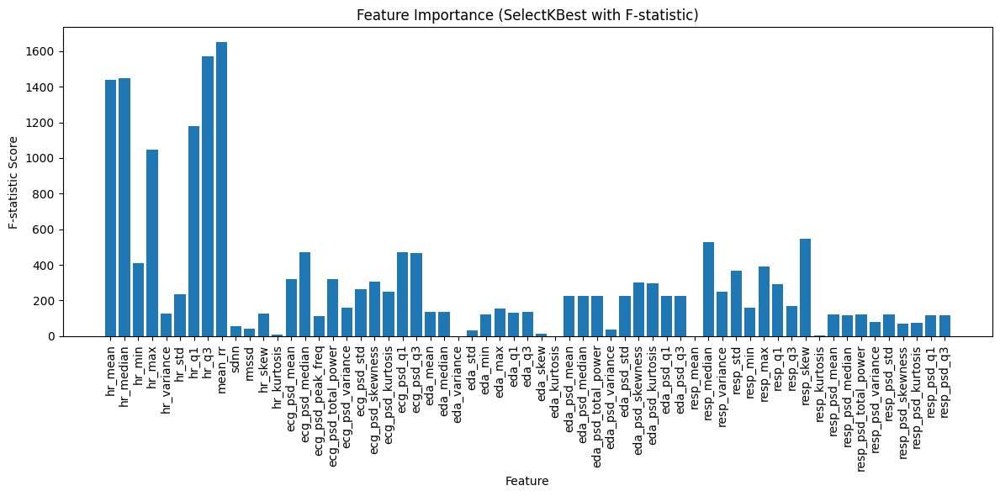

In [81]:
# Feature selection
selector = SelectKBest(score_func=f_classif, k=50)
X_train_selected = selector.fit_transform(X_train_scaled, y_train_resampled)
X_test_selected = selector.transform(X_test_scaled)

# Get the boolean mask of selected features
selected_features_mask = selector.get_support()

# Get the names of all features
all_feature_names = pd.DataFrame(X_train).columns  
# Get the names of the selected features
feature_scores = selector.scores_
# Plot the feature scores
plt.figure(figsize=(12, 6))
plt.bar(all_feature_names, feature_scores)
plt.xticks(rotation=90)
plt.xlabel("Feature")
plt.ylabel("F-statistic Score")
plt.title("Feature Importance (SelectKBest with F-statistic)")
plt.tight_layout()
plt.show()

# 1.binary

In [82]:
# Logistic Regression with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)

# Fit and evaluate
model.fit(X_train_selected, y_train_resampled)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

Train Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.97       932
         1.0       0.97      0.96      0.97       932

    accuracy                           0.97      1864
   macro avg       0.97      0.97      0.97      1864
weighted avg       0.97      0.97      0.97      1864

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       234
         1.0       0.94      0.94      0.94        66

    accuracy                           0.97       300
   macro avg       0.96      0.96      0.96       300
weighted avg       0.97      0.97      0.97       300



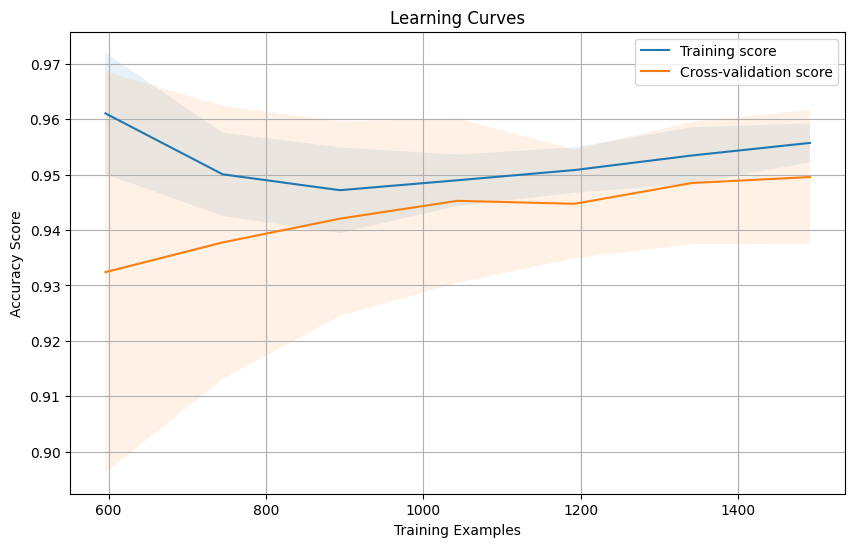

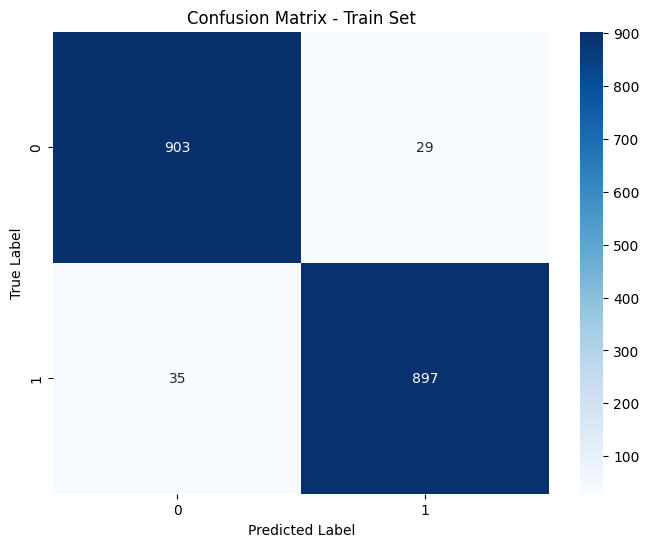

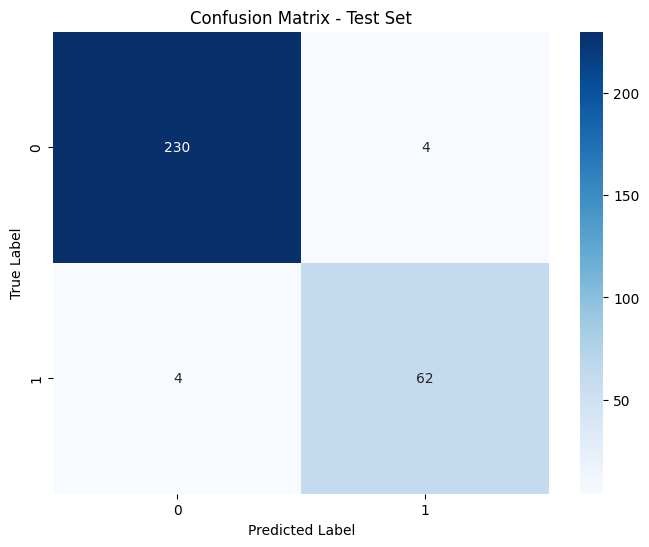

Cross-Validation Scores: [0.9340836  0.95491143 0.96135266]
Mean CV Score: 0.9501158971544358
Standard Deviation: 0.011637531932524875
Train Accuracy: 0.9656652360515021
Test Accuracy: 0.9733333333333334


In [83]:
evaluate_classifier(
    model,
    X_train_resampled,
    y_train_resampled,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred
)

saving best model

In [84]:
filename_model = 'logistic_regression_model.pkl'
filename_scaler = 'scaler.pkl'

pickle.dump(model, open(filename_model, 'wb'))
pickle.dump(scaler, open(filename_scaler, 'wb'))  # Save the scaler

print(f"Model saved to {filename_model}")
print(f"Scaler saved to {filename_scaler}")


Model saved to logistic_regression_model.pkl
Scaler saved to scaler.pkl


# **Multi**

In [88]:
X = features_df_60_30.drop(['label', 'binary_label'], axis=1)
y = features_df_60_30['label'].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)
# Feature selection
selector = SelectKBest(score_func=f_classif, k=50)
X_train_selected = selector.fit_transform(X_train_scaled, y_train_resampled)
X_test_selected = selector.transform(X_test_scaled)

In [89]:

# Logistic Regression with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)

# Fit and evaluate
model.fit(X_train_selected, y_train_resampled)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.76      0.73      0.74       468
         2.0       0.97      0.97      0.97       468
         3.0       0.75      0.79      0.77       468
         4.0       0.89      0.89      0.89       468

    accuracy                           0.84      1872
   macro avg       0.84      0.84      0.84      1872
weighted avg       0.84      0.84      0.84      1872

Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.84      0.77      0.81       118
         2.0       0.97      0.88      0.92        66
         3.0       0.49      0.63      0.55        38
         4.0       0.82      0.87      0.84        78

    accuracy                           0.80       300
   macro avg       0.78      0.79      0.78       300
weighted avg       0.82      0.80      0.81       300



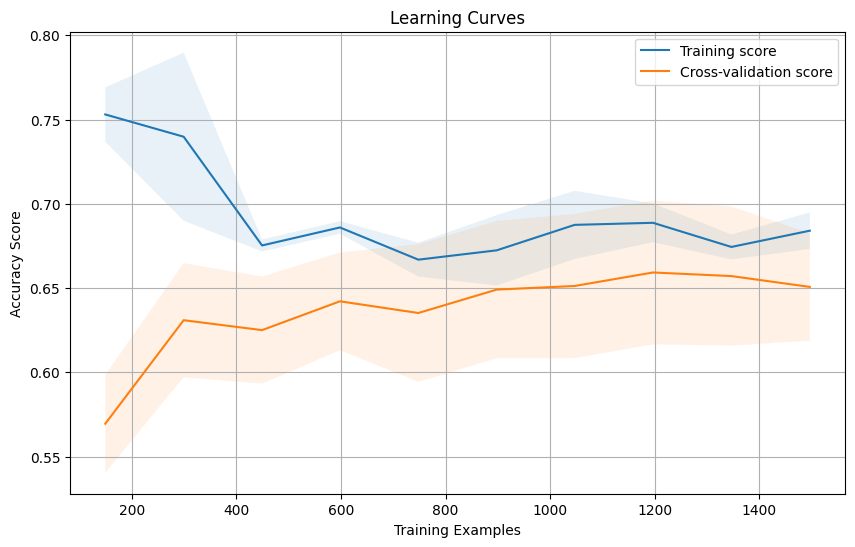

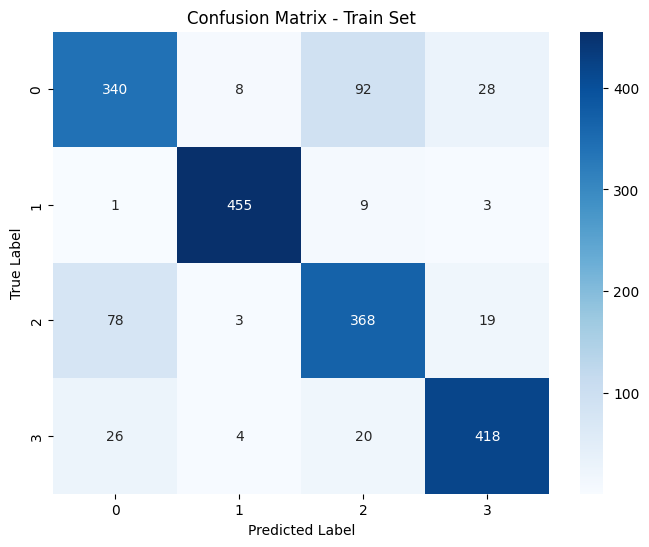

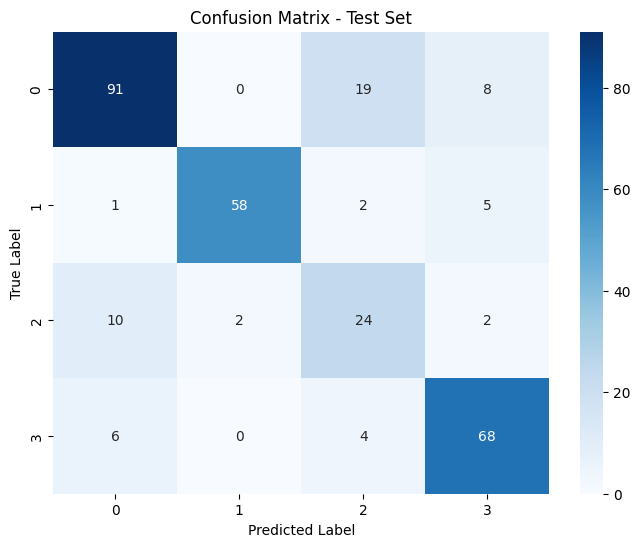

Cross-Validation Scores: [0.62820513 0.63942308 0.70352564]
Mean CV Score: 0.657051282051282
Standard Deviation: 0.03317991485741357
Train Accuracy: 0.844551282051282
Test Accuracy: 0.8033333333333333


In [90]:
evaluate_classifier(
    model,
    X_train_resampled,
    y_train_resampled,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred
)

# **60_20**

In [93]:
X = features_df_60_20.drop(['label', 'binary_label'], axis=1)
y = features_df_60_20['binary_label'].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Feature selection
selector = SelectKBest(score_func=f_classif, k=50)
X_train_selected = selector.fit_transform(X_train_scaled, y_train_resampled)
X_test_selected = selector.transform(X_test_scaled)

# binary

In [94]:

# Logistic Regression with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)

# Fit and evaluate
model.fit(X_train_selected, y_train_resampled)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

Train Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.97      0.96      1394
         1.0       0.97      0.96      0.96      1394

    accuracy                           0.96      2788
   macro avg       0.96      0.96      0.96      2788
weighted avg       0.96      0.96      0.96      2788

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       349
         1.0       0.90      0.91      0.91       100

    accuracy                           0.96       449
   macro avg       0.94      0.94      0.94       449
weighted avg       0.96      0.96      0.96       449



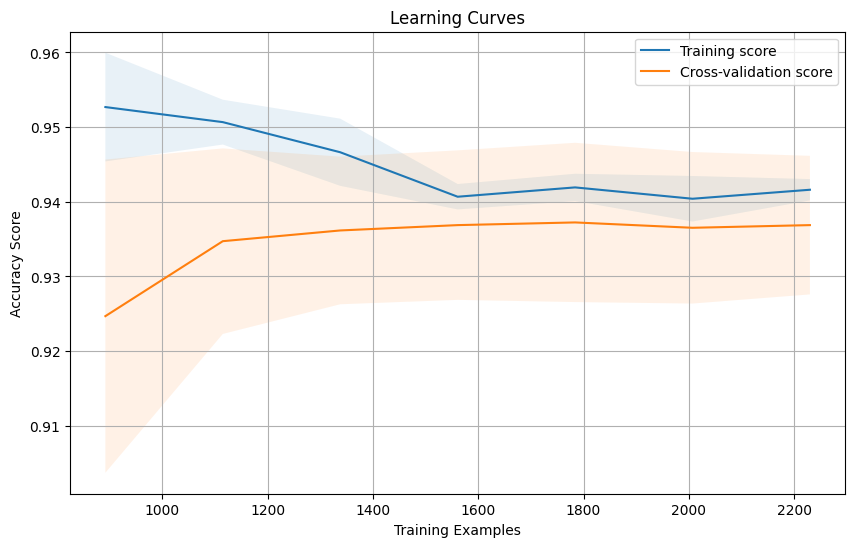

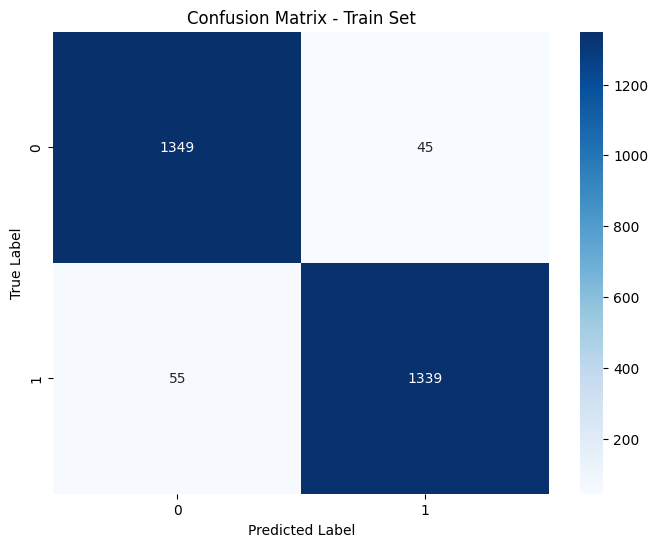

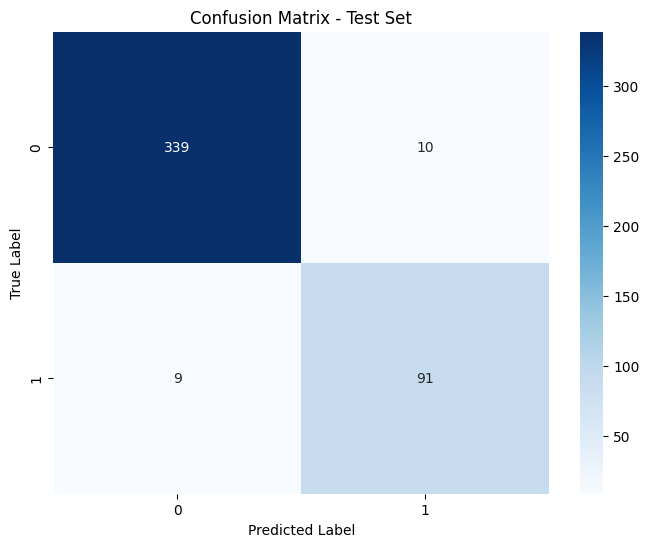

Cross-Validation Scores: [0.93225806 0.93972013 0.93003229]
Mean CV Score: 0.9340034954917416
Standard Deviation: 0.004143142158227424
Train Accuracy: 0.9641319942611191
Test Accuracy: 0.9576837416481069


In [95]:
evaluate_classifier(
    model,
    X_train_resampled,
    y_train_resampled,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred
)

# **Multi**

In [98]:
X_m = features_df_60_20.drop(['label', 'binary_label'], axis=1)
y_m = features_df_60_20['label'].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X_m, y_m, test_size=0.2, random_state=42, stratify=y_m
)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Feature selection
selector = SelectKBest(score_func=f_classif, k=50)
X_train_selected = selector.fit_transform(X_train_scaled, y_train_resampled)
X_test_selected = selector.transform(X_test_scaled)

In [99]:

# Logistic Regression with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)

# Fit and evaluate
model.fit(X_train_selected, y_train_resampled)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.74      0.74      0.74       703
         2.0       0.96      0.96      0.96       703
         3.0       0.74      0.74      0.74       703
         4.0       0.90      0.90      0.90       703

    accuracy                           0.84      2812
   macro avg       0.84      0.84      0.84      2812
weighted avg       0.84      0.84      0.84      2812

Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.87      0.77      0.81       176
         2.0       0.97      0.87      0.92       100
         3.0       0.51      0.79      0.62        56
         4.0       0.86      0.86      0.86       117

    accuracy                           0.82       449
   macro avg       0.80      0.82      0.80       449
weighted avg       0.84      0.82      0.82       449



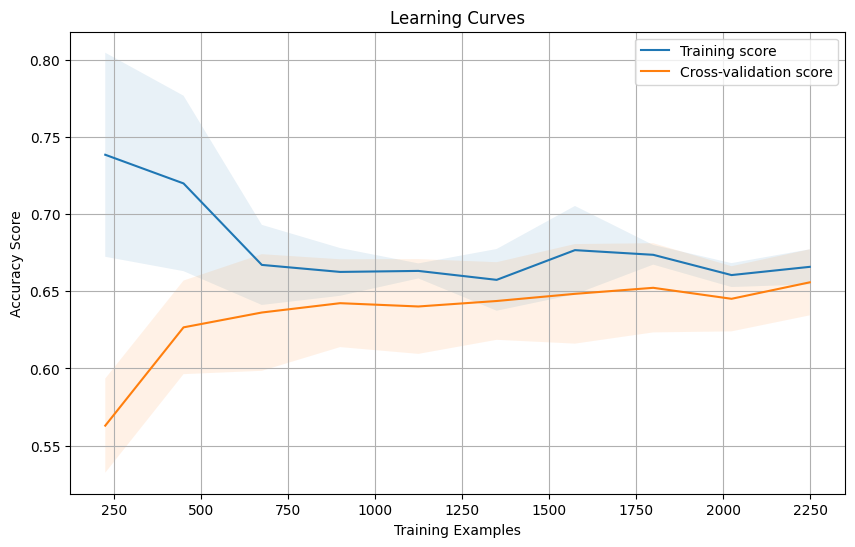

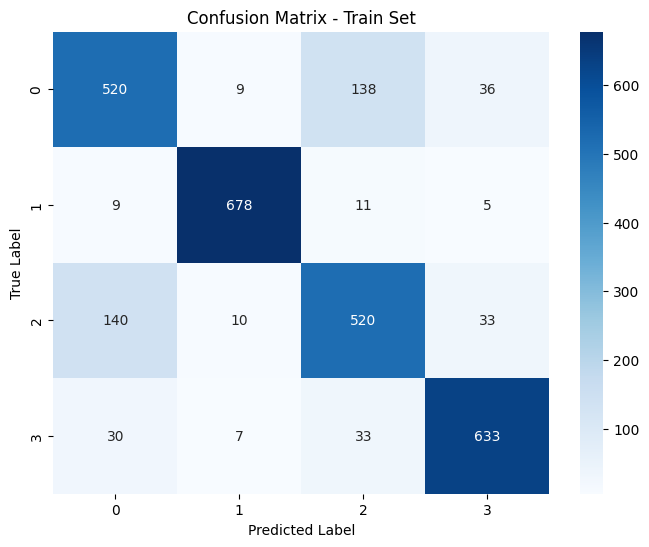

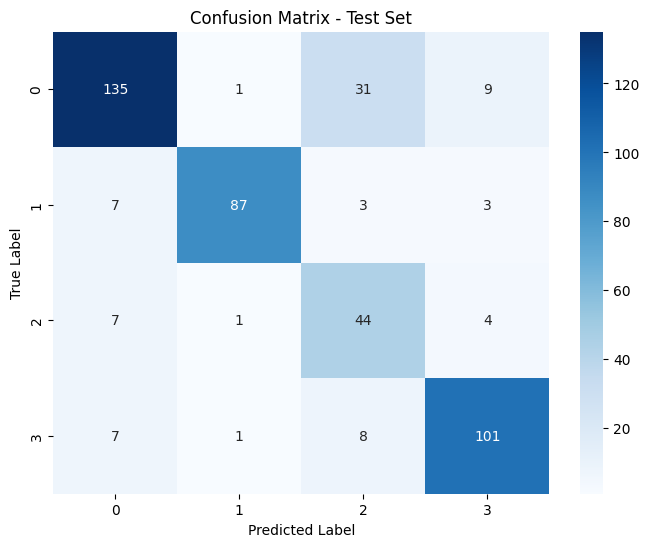

Cross-Validation Scores: [0.61407249 0.65208111 0.6755603 ]
Mean CV Score: 0.6472379678069479
Standard Deviation: 0.02533481838868982
Train Accuracy: 0.8360597439544808
Test Accuracy: 0.8173719376391982


In [100]:
evaluate_classifier(
    model,
    X_train_resampled,
    y_train_resampled,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred
)

In [ ]:
filename_model = 'logistic_regression_model.pkl'
filename_scaler = 'scaler.pkl'

pickle.dump(model, open(filename_model, 'wb'))
pickle.dump(scaler, open(filename_scaler, 'wb'))  # Save the scaler

print(f"Model saved to {filename_model}")
print(f"Scaler saved to {filename_scaler}")

# **60_10**

In [103]:
X = features_df_60_10.drop(['label', 'binary_label'], axis=1)
y = features_df_60_10['binary_label'].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Feature selection
selector = SelectKBest(score_func=f_classif, k=50)
X_train_selected = selector.fit_transform(X_train_scaled, y_train_resampled)
X_test_selected = selector.transform(X_test_scaled)

# **binary**

In [104]:
# Logistic Regression with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)

# Fit and evaluate
model.fit(X_train_selected, y_train_resampled)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

Train Classification Report:
              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97      2794
         1.0       0.97      0.97      0.97      2794

    accuracy                           0.97      5588
   macro avg       0.97      0.97      0.97      5588
weighted avg       0.97      0.97      0.97      5588

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97       698
         1.0       0.86      0.97      0.91       200

    accuracy                           0.96       898
   macro avg       0.93      0.96      0.94       898
weighted avg       0.96      0.96      0.96       898



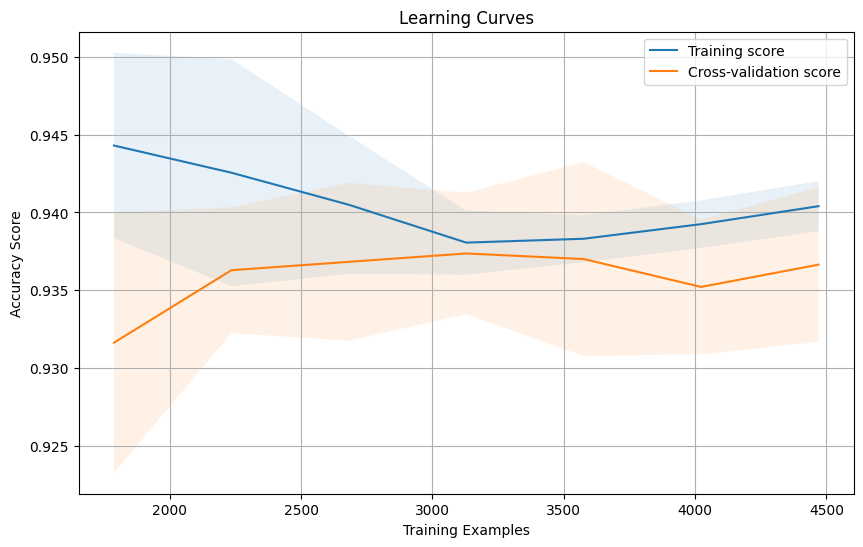

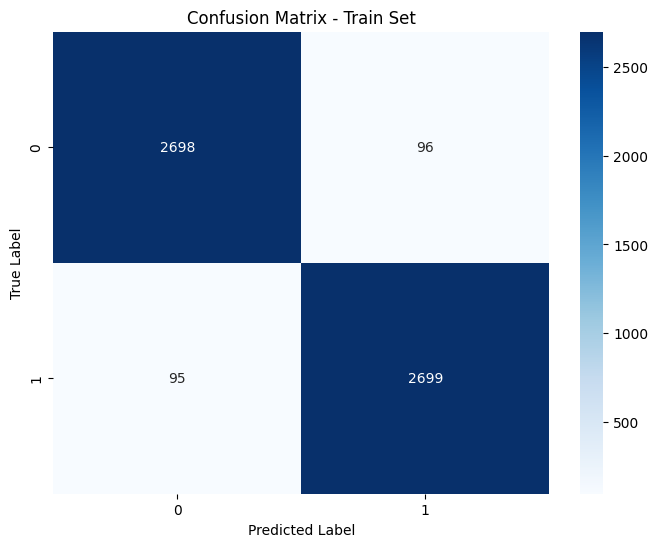

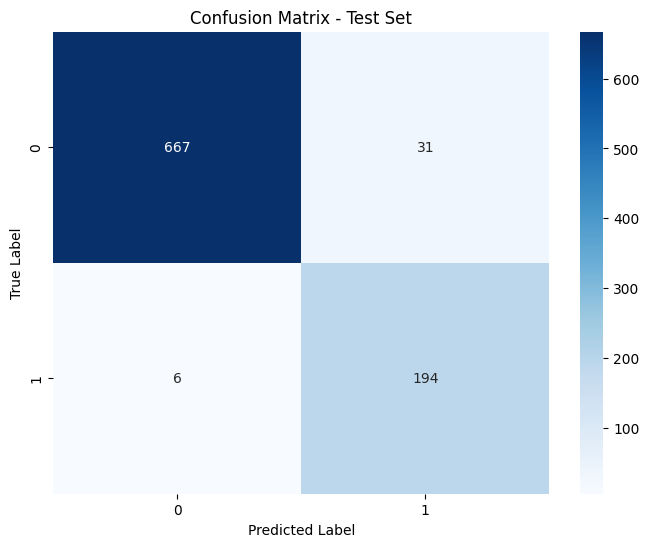

Cross-Validation Scores: [0.93612453 0.9366613  0.94360902]
Mean CV Score: 0.9387982839546533
Standard Deviation: 0.003408756818090824
Train Accuracy: 0.9658196134574087
Test Accuracy: 0.9587973273942093


In [105]:
evaluate_classifier(
    model,
    X_train_resampled,
    y_train_resampled,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred
)

# **Multi**

In [108]:
X_m = features_df_60_20.drop(['label', 'binary_label'], axis=1)
y_m = features_df_60_20['label'].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X_m, y_m, test_size=0.2, random_state=42, stratify=y_m
)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Feature selection
selector = SelectKBest(score_func=f_classif, k=50)
X_train_selected = selector.fit_transform(X_train_scaled, y_train_resampled)
X_test_selected = selector.transform(X_test_scaled)

In [109]:
# Logistic Regression with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)

# Fit and evaluate
model.fit(X_train_selected, y_train_resampled)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

Train Classification Report:
              precision    recall  f1-score   support

         1.0       0.74      0.74      0.74       703
         2.0       0.96      0.96      0.96       703
         3.0       0.74      0.74      0.74       703
         4.0       0.90      0.90      0.90       703

    accuracy                           0.84      2812
   macro avg       0.84      0.84      0.84      2812
weighted avg       0.84      0.84      0.84      2812

Test Classification Report:
              precision    recall  f1-score   support

         1.0       0.87      0.77      0.81       176
         2.0       0.97      0.87      0.92       100
         3.0       0.51      0.79      0.62        56
         4.0       0.86      0.86      0.86       117

    accuracy                           0.82       449
   macro avg       0.80      0.82      0.80       449
weighted avg       0.84      0.82      0.82       449



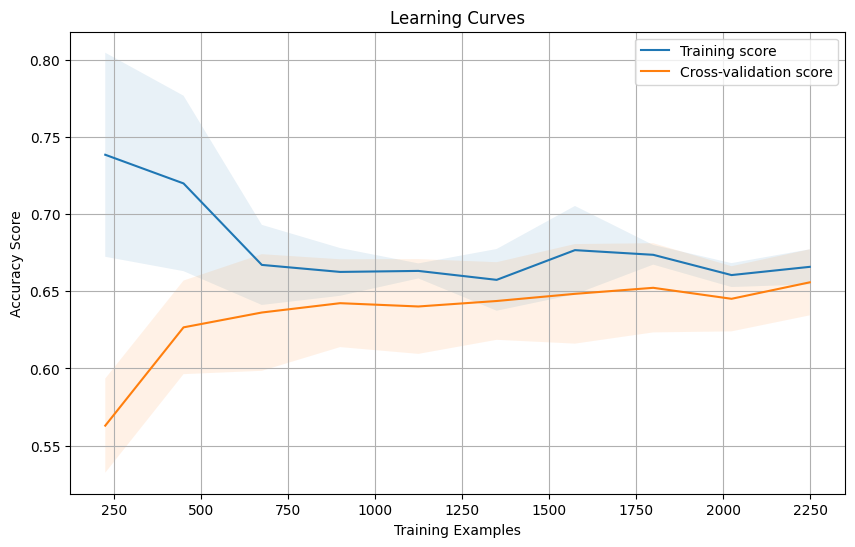

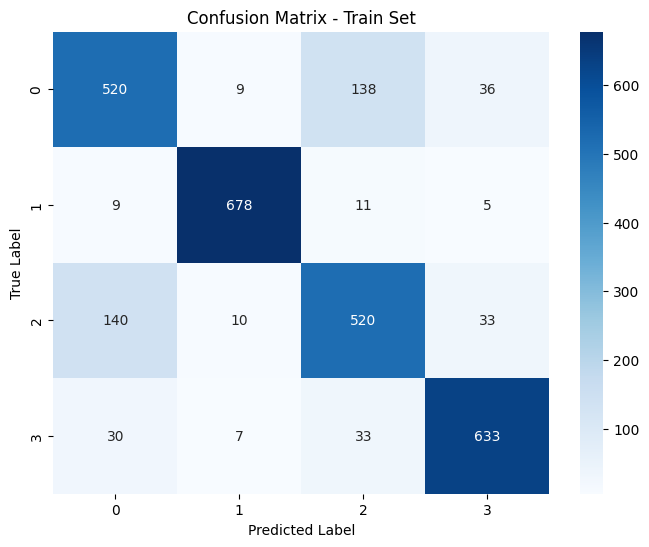

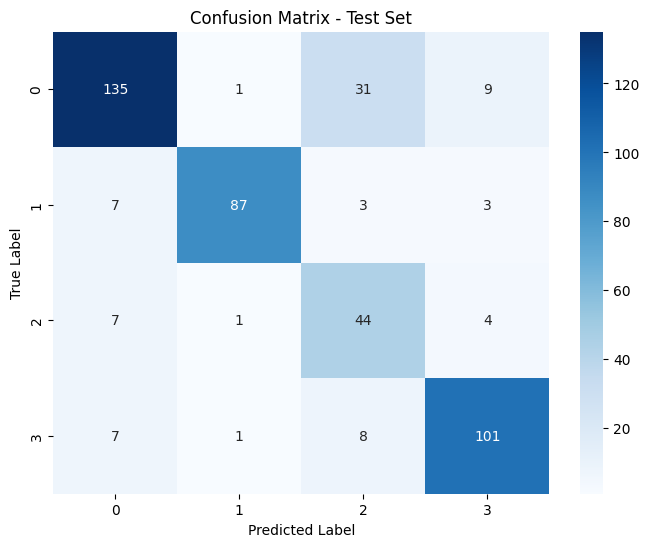

Cross-Validation Scores: [0.61407249 0.65208111 0.6755603 ]
Mean CV Score: 0.6472379678069479
Standard Deviation: 0.02533481838868982
Train Accuracy: 0.8360597439544808
Test Accuracy: 0.8173719376391982


In [110]:
evaluate_classifier(
    model,
    X_train_resampled,
    y_train_resampled,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred
)

# 60_30 without smote

binary

In [113]:
X = features_df_60_30.drop(['label', 'binary_label'], axis=1)
y = features_df_60_30['binary_label'].astype(float)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Feature selection
selector = SelectKBest(score_func=f_classif, k=50)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_test_scaled)

In [114]:
# Logistic Regression with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42, max_iter=1000)

# Fit and evaluate
model.fit(X_train_selected, y_train)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

Train Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97       932
         1.0       0.87      0.96      0.91       265

    accuracy                           0.96      1197
   macro avg       0.93      0.96      0.94      1197
weighted avg       0.96      0.96      0.96      1197

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.97      0.98       234
         1.0       0.91      0.92      0.92        66

    accuracy                           0.96       300
   macro avg       0.94      0.95      0.95       300
weighted avg       0.96      0.96      0.96       300



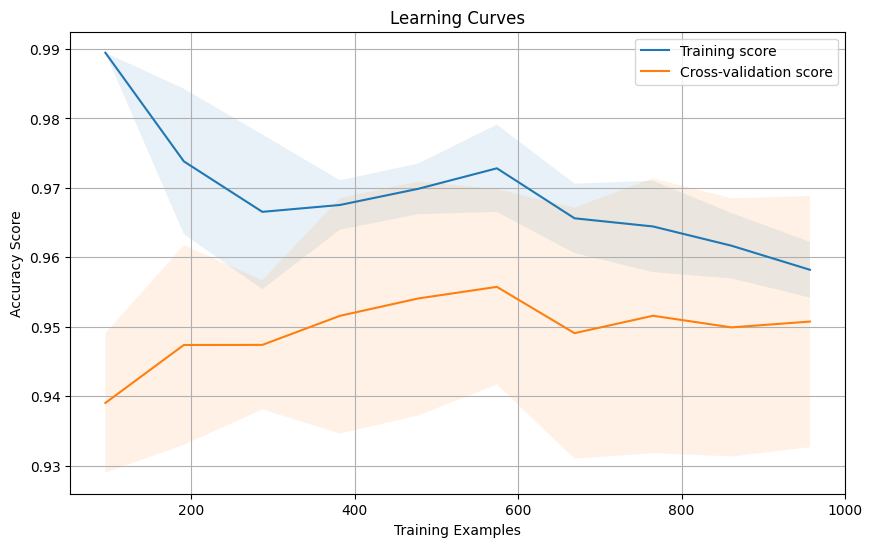

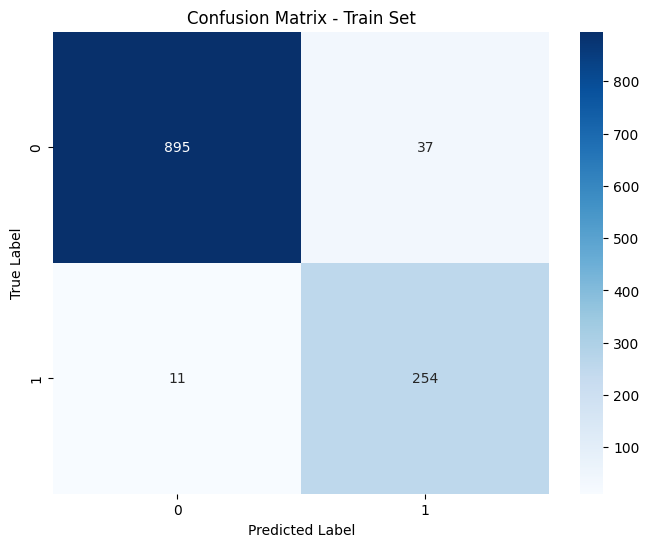

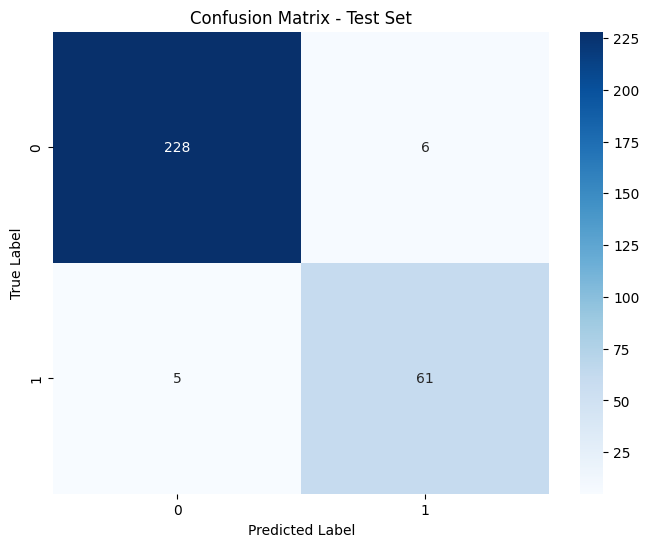

Cross-Validation Scores: [0.93734336 0.96992481 0.95238095]
Mean CV Score: 0.9532163742690057
Standard Deviation: 0.013314433960325191
Train Accuracy: 0.9598997493734336
Test Accuracy: 0.9633333333333334


In [115]:
evaluate_classifier(
    model,
    X_train_selected,
    y_train,
    y_train_pred,
    X_test,
    y_test,
    y_test_pred
)